<a id="section_ID"></a>

# Predicting superconducting transition temperature from elemental physical properties
- [OLS](#ols)
- [Lasso](#lasso)
- [Ridge](#ridge)
- [XGBoost (tree)](#xgbtree)
- [XGBoost (linear)](#xgblinear)

***

In [857]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from bayes_opt import BayesianOptimization
from sklearn.base import BaseEstimator
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, cross_val_score, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression
from sklearn import __version__ as sklearn_version
import datetime
import xgboost as xgb
import sys
from joblib import dump

# Import data and split train-test

In [5]:
#import data and exclude the outlier
data = pd.read_csv('../data/raw/train.csv')
data = data.loc[data.critical_temp!=185]

In [6]:
X = data.iloc[:,:-1]
y = data.iloc[:,-1]

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [8]:
kf = KFold(n_splits=5, shuffle=True, random_state=0)

# OLS<a id='ols'><a>

Try the most simple model.

Since ranges of each feature are on different scale, use StandardScaler first. 

In [431]:
steps = [('scaler', StandardScaler()), ('ols', LinearRegression())]
pipeline = Pipeline(steps)
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'test rmse: {rmse:.2f}, r2: {r2:.2f}')

test rmse: 17.68, r2: 0.73


## Select k best

Check if selecting feature can improve the model.

In [99]:
steps = [('scaler', StandardScaler()), ('selectkbest', SelectKBest(f_regression)), ('ols', LinearRegression())]
pipeline = Pipeline(steps)
k = [k for k in range(1,X_train.shape[1]+1)]
parameters = {'selectkbest__k':k}
ols_k_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
ols_k_cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('selectkbest',
                                        SelectKBest(score_func=<function f_regression at 0x000001BEDC07D9E0>)),
                                       ('ols', LinearRegression())]),
             param_grid={'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29,
                                            30, ...]},
             scoring='neg_root_mean_squared_error')

In [558]:
ols_k_cv.best_params_, -ols_k_cv.best_score_

({'selectkbest__k': 81}, 17.574756824294887)

In [106]:
test_score = []
for i in range(1, 82):
    steps = [('scaler', StandardScaler()), ('selectkbest', SelectKBest(f_regression, k=i)), ('ols', LinearRegression())]
    pipeline = Pipeline(steps)
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    test_score.append(rmse)

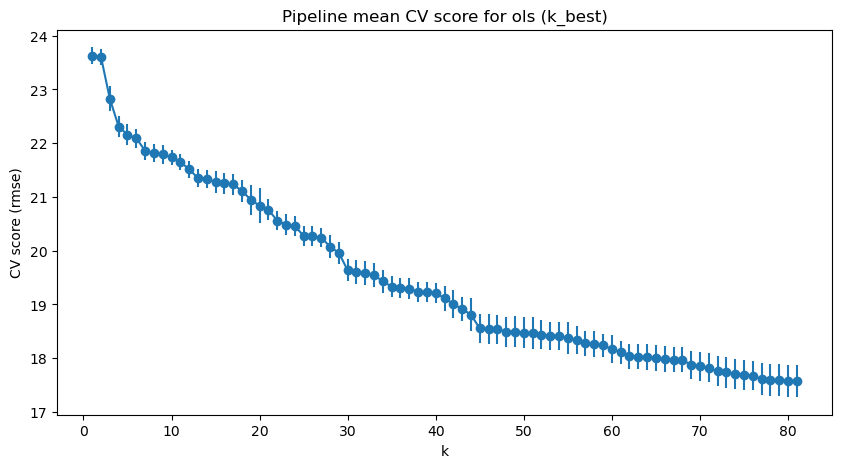

In [293]:
score_mean = -ols_k_cv.cv_results_['mean_test_score']
score_std = ols_k_cv.cv_results_['std_test_score']

plt.figure(figsize=(10,5))
plt.errorbar(k, score_mean, yerr=score_std, fmt='-o')
plt.ylabel('CV score (rmse)')
plt.xlabel('k')
plt.title('Pipeline mean CV score for ols (k_best)')
plt.show()

The best k is 81.

In [121]:
score_mean = -ols_k_cv.cv_results_['mean_test_score']
score_std = ols_k_cv.cv_results_['std_test_score']
fig = go.Figure()
fig.add_trace(go.Scatter(x=k, y=score_mean, error_y=dict(type='data', array=score_std,
            visible=True), mode='lines+markers', name='mean cv score'))
fig.add_trace(go.Scatter(x=k, y=test_score, name='test score', mode='lines+markers'))
fig.update_layout(showlegend=True, template = 'plotly', title='Pipeline mean CV score and test score',
                  yaxis_title='score (rmse)',xaxis_title='k')
fig.show()

Check coefficients of the ols.

In [294]:
coef = ols_k_cv.best_estimator_.named_steps.ols.coef_
coef_df = pd.DataFrame({'feature': X_train.columns, 'coefficient': coef})
topten_ols = coef_df.nlargest(10, 'coefficient')
topten_ols

,feature,coefficient
22,wtd_mean_atomic_radius,89.330910
72,wtd_mean_Valence,29.019828
75,entropy_Valence,27.968069
49,std_ElectronAffinity,27.373403
25,entropy_atomic_radius,27.218533
62,wtd_mean_ThermalConductivity,23.921843
73,gmean_Valence,23.715704
1,mean_atomic_mass,23.665618
17,range_fie,22.970673
4,wtd_gmean_atomic_mass,21.640617


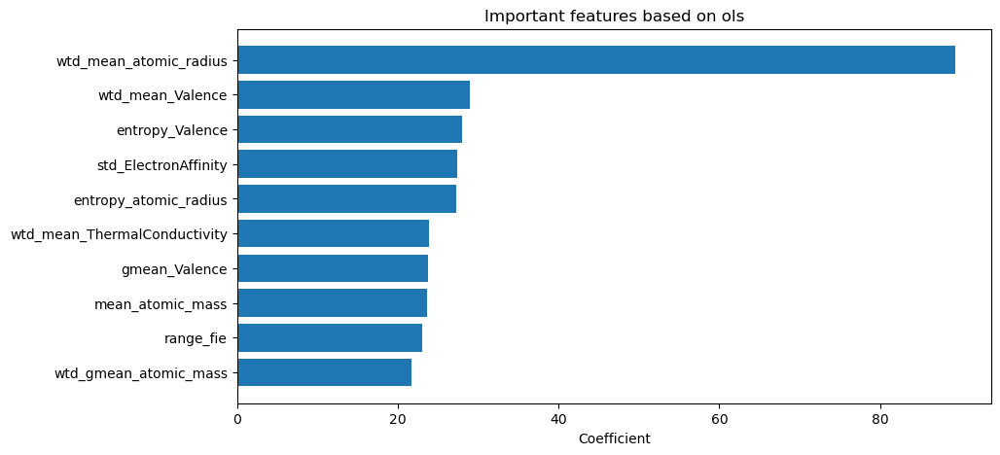

In [599]:
plt.figure(figsize=(10,5))
plt.barh(topten_ols.feature[::-1], topten_ols.coefficient[::-1])
plt.xlabel('Coefficient')
plt.title('Important features based on ols')
plt.show()

The most important feature is __weighted mean atomic radius__.

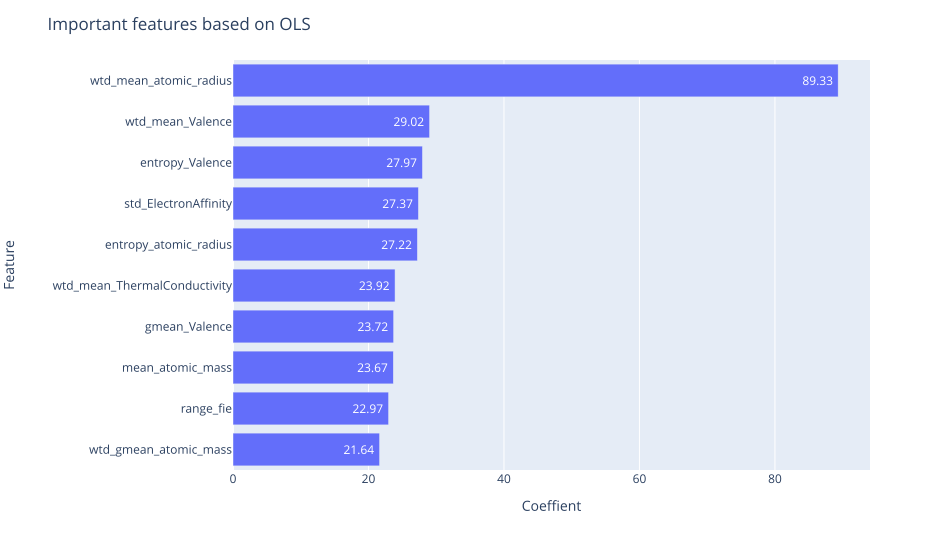

In [794]:
fig = px.bar(x=topten_ols.coefficient[::-1], y=topten_ols.feature[::-1], text_auto='.4', width=950, height=550)
fig.update_layout(template = 'plotly', title='Important features based on OLS',yaxis_title='Feature',xaxis_title='Coeffient')
fig.show('svg')

## PCA

Try using pca.

In [63]:
steps = [('scaler', StandardScaler()), ('pca', PCA()), ('ols', LinearRegression())]
pipeline = Pipeline(steps)
n = [n for n in range(1, X_train.shape[1]+1)]
parameters = {'pca__n_components':n}
ols_pca_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
ols_pca_cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('ols', LinearRegression())]),
             param_grid={'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                               11, 12, 13, 14, 15, 16, 17, 18,
                                               19, 20, 21, 22, 23, 24, 25, 26,
                                               27, 28, 29, 30, ...]},
             scoring='neg_root_mean_squared_error')

In [559]:
ols_pca_cv.best_params_, -ols_pca_cv.best_score_

({'pca__n_components': 81}, 17.574756824294887)

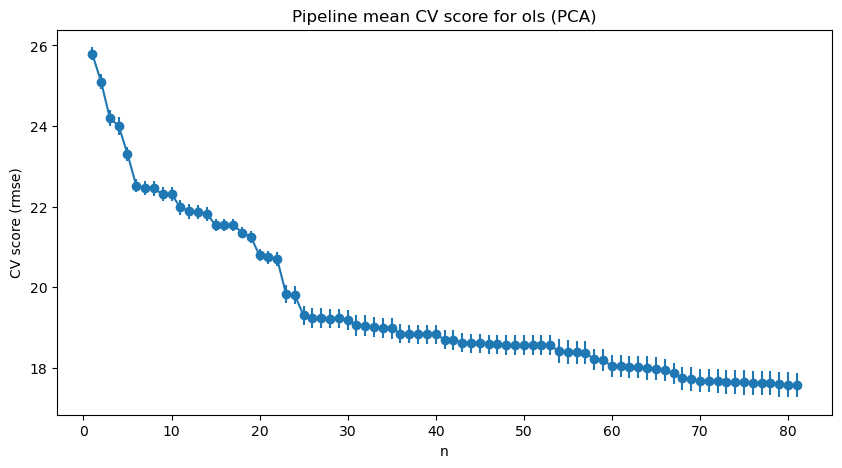

In [331]:
score_mean = -ols_pca_cv.cv_results_['mean_test_score']
score_std = ols_pca_cv.cv_results_['std_test_score']

plt.figure(figsize=(10,5))
plt.errorbar(n, score_mean, yerr=score_std, fmt='-o')
plt.ylabel('CV score (rmse)')
plt.xlabel('n')
plt.title('Pipeline mean CV score for ols (PCA)')
plt.show()

The best n is 81.

In [131]:
score_mean = -ols_pca_cv.cv_results_['mean_test_score']
score_std = ols_pca_cv.cv_results_['std_test_score']
fig = go.Figure()
fig.add_trace(go.Scatter(x=n, y=score_mean, error_y=dict(type='data', array=score_std,
            visible=True), mode='lines+markers', name='mean cv score'))
fig.add_trace(go.Scatter(x=n, y=test_score, name='test score', mode='lines+markers'))
fig.update_layout(showlegend=True, template = 'plotly', title='Pipeline mean CV score and test score',
                  yaxis_title='score (rmse)',xaxis_title='n')
fig.show()

## Result from ols

Best model of ols is just the base model.

In [777]:
y_pred = ols_k_cv.best_estimator_.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'test rmse: {rmse:.2f}, r2: {r2:.2f}')

test rmse: 17.68, r2: 0.73


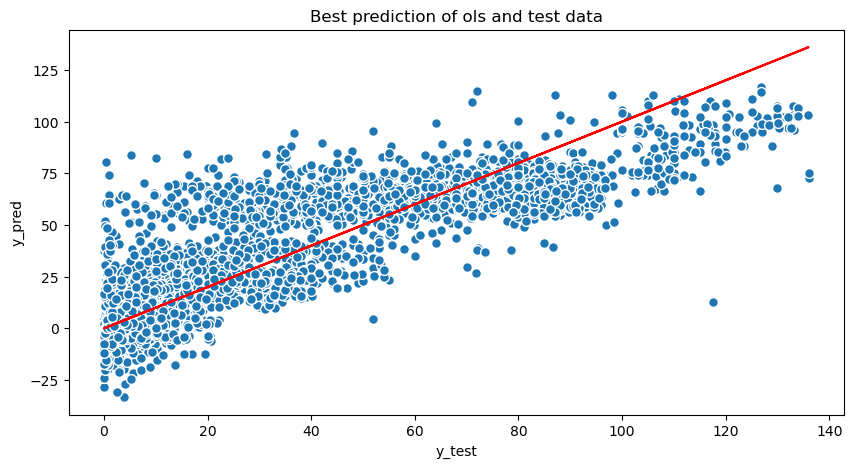

In [778]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, y_pred, s=50, edgecolors='white')
plt.plot(y_test, y_test, 'r-')
plt.xlabel('y_test')
plt.ylabel('y_pred')
plt.title('Best prediction of ols and test data')
plt.show()

The red line indicate the perfect prediction.

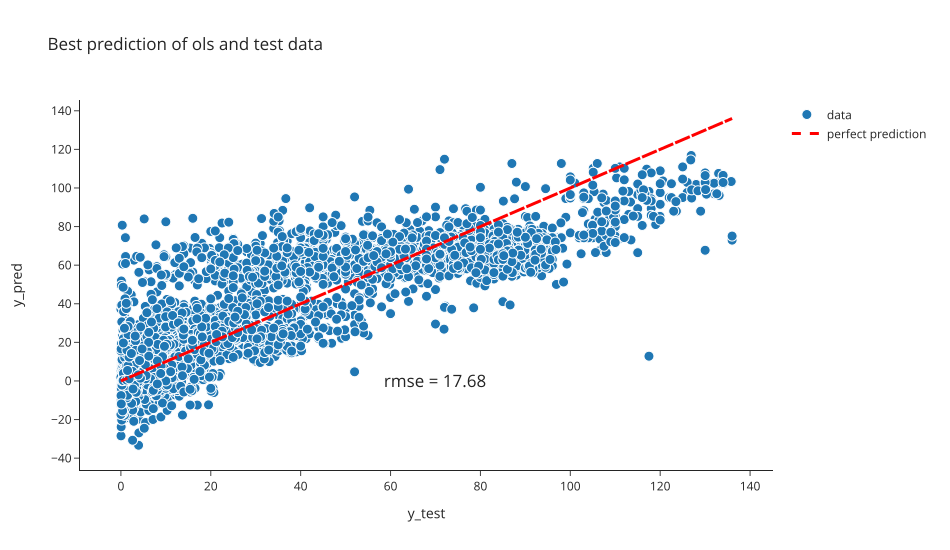

In [783]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test, y=y_pred, name='data',mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))
fig.add_trace(go.Scatter(x=y_test, y=y_test, name='perfect prediction',mode='lines', line=dict(dash='dash', color='red', width=3)))
fig.add_annotation(x=70, y=0, text=f'rmse = {rmse:.2f}', showarrow=False,  font={'size':17})
fig.update_layout(template = 'simple_white', title='Best prediction of ols and test data',
                  yaxis_title='y_pred',xaxis_title='y_test', showlegend=True, width=950, height=550)
fig.show('svg')

# Lasso<a id='lasso'><a>

Do GridSearchCV with k in SelectKBest and alpha in Lasso.

In [334]:
steps = [('scaler', StandardScaler()), ('selectkbest', SelectKBest(f_regression)), ('lasso', Lasso(max_iter=100000))]
# increase max_iter to avoid divergence
pipeline = Pipeline(steps)
k = [k for k in range(1,X_train.shape[1]+1)]
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
parameters = {'selectkbest__k':k, 'lasso__alpha':alpha}
lasso_k_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error')
lasso_k_cv.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('selectkbest',
                                        SelectKBest(score_func=<function f_regression at 0x000001BEDC07D9E0>)),
                                       ('lasso', Lasso(max_iter=100000))]),
             param_grid={'lasso__alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29,
                                            30, ...]},
             scoring='neg_root_mean_squared_error')

In [566]:
lasso_k_cv.best_params_, -lasso_k_cv.best_score_

({'lasso__alpha': 0.001, 'selectkbest__k': 81}, 17.557320017327037)

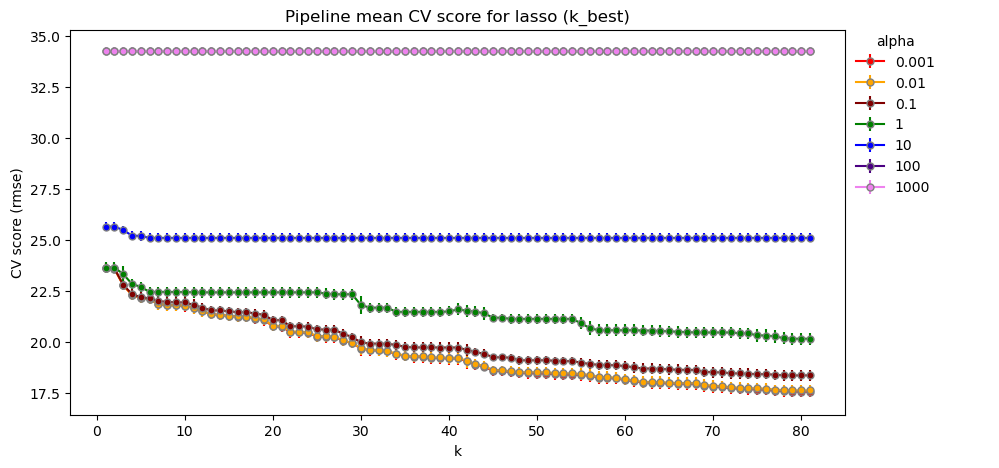

In [594]:
result = pd.DataFrame({'alpha':lasso_k_cv.cv_results_['param_lasso__alpha'], 'k':lasso_k_cv.cv_results_['param_selectkbest__k'],
                       'mean':-lasso_k_cv.cv_results_['mean_test_score'], 'std':lasso_k_cv.cv_results_['std_test_score']})
plt.figure(figsize=(10,5))
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
colors = ['red', 'orange', 'maroon', 'green', 'blue', 'indigo', 'violet']
color_map = dict(zip(alpha, colors))
for i in alpha:
    plt.errorbar(result.k.loc[result.alpha==i], result['mean'].loc[result.alpha==i], 
                 yerr=result['std'].loc[result.alpha==i],color=color_map[i], 
                 fmt='o-', markersize=5, markeredgecolor='gray',label=f'{i}')
plt.legend(bbox_to_anchor=(1.48, 0.93), bbox_transform=fig.transFigure, title = 'alpha', frameon=False)
plt.ylabel('CV score (rmse)')
plt.xlabel('k')
plt.title('Pipeline mean CV score for lasso (k_best)')
plt.show()

In [46]:
result = pd.DataFrame({'alpha':lasso_k_cv.cv_results_['param_lasso__alpha'], 'k':lasso_k_cv.cv_results_['param_selectkbest__k'],
                       'mean':-lasso_k_cv.cv_results_['mean_test_score'], 'std':lasso_k_cv.cv_results_['std_test_score']})
fig = px.scatter(result, x='k', y='mean', error_y='std', color='alpha')
fig.update_layout(template = 'plotly', title='Pipeline mean CV score',yaxis_title='CV score (rmse)',xaxis_title='k')
fig.show()

In [660]:
steps = [('scaler', StandardScaler()), ('selectkbest', SelectKBest(mutual_info_regression)), ('lasso', Lasso(max_iter=100000))]
# increase max_iter to avoid divergence
pipeline = Pipeline(steps)
k = [k for k in range(1,X_train.shape[1]+1)]
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
parameters = {'selectkbest__k':k, 'lasso__alpha':alpha}
lasso_mi_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error')
lasso_mi_cv.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('selectkbest',
                                        SelectKBest(score_func=<function mutual_info_regression at 0x000001BEDC05F600>)),
                                       ('lasso', Lasso(max_iter=100000))]),
             param_grid={'lasso__alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29,
                                            30, ...]},
             scoring='neg_root_mean_squared_error')

In [661]:
lasso_mi_cv.best_params_, lasso_mi_cv.best_score_

({'lasso__alpha': 0.001, 'selectkbest__k': 81}, -17.557320017327037)

Check coefficients

In [567]:
coef = lasso_k_cv.best_estimator_.named_steps.lasso.coef_
coef_df = pd.DataFrame({'feature': X_train.columns, 'coefficient': coef})
topten_lasso = coef_df.nlargest(10, 'coefficient')
topten_lasso

,feature,coefficient
22,wtd_mean_atomic_radius,76.220361
49,std_ElectronAffinity,27.500983
75,entropy_Valence,26.421560
62,wtd_mean_ThermalConductivity,24.077418
17,range_fie,22.389539
1,mean_atomic_mass,20.565613
42,wtd_mean_ElectronAffinity,18.829260
54,wtd_gmean_FusionHeat,18.524301
26,wtd_entropy_atomic_radius,17.852471
4,wtd_gmean_atomic_mass,16.930055


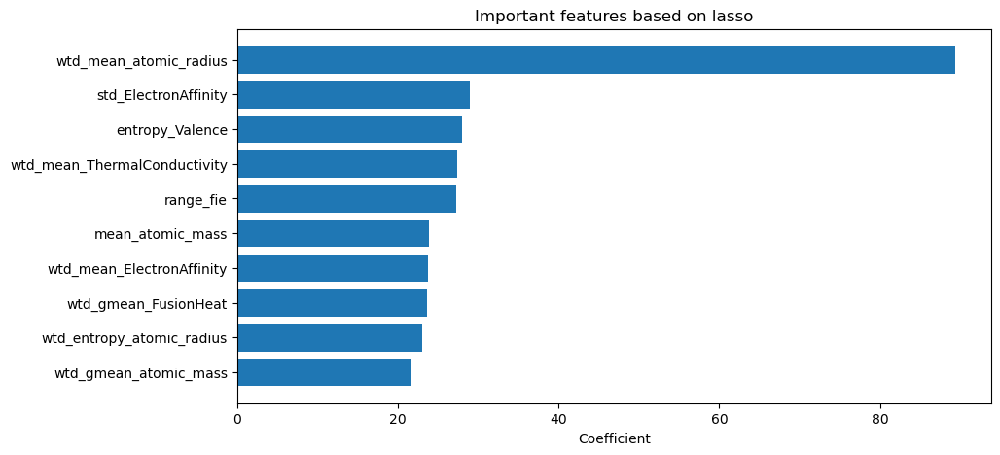

In [598]:
plt.figure(figsize=(10,5))
plt.barh(topten_lasso.feature[::-1], topten_ols.coefficient[::-1])
plt.xlabel('Coefficient')
plt.title('Important features based on lasso')
plt.show()

The most important feature is __weighted mean atomic radius__.

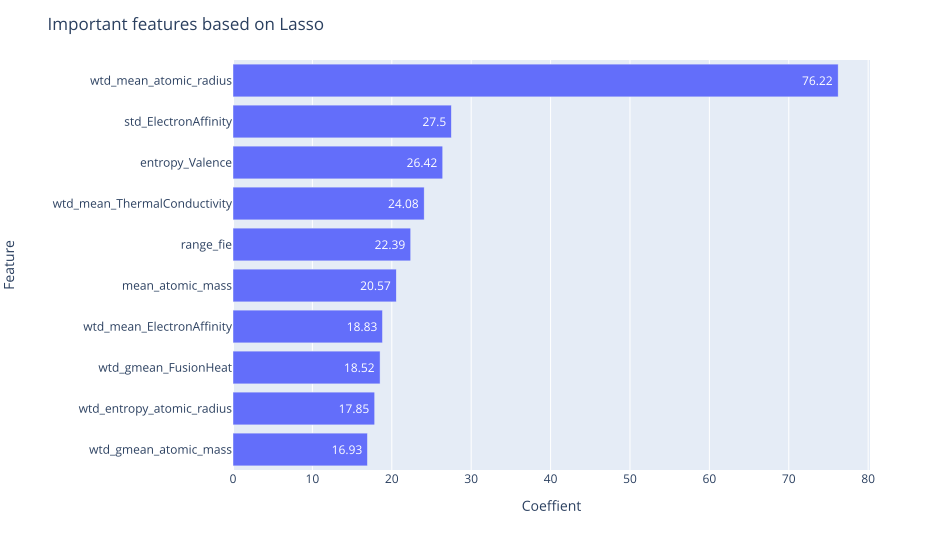

In [776]:
fig = px.bar(x=topten_lasso.coefficient[::-1], y=topten_lasso.feature[::-1], text_auto='.4', width=950, height=550)
fig.update_layout(template = 'plotly', title='Important features based on Lasso',yaxis_title='Feature',xaxis_title='Coeffient')
fig.show('svg')

## PCA

In [87]:
steps = [('scaler', StandardScaler()), ('pca', PCA()), ('lasso', Lasso(max_iter=100000))]
# increase max_iter to avoid divergence
pipeline = Pipeline(steps)
n = [n for n in range(1,X_train.shape[1]+1)]
parameters = {'pca__n_components':n , 'lasso__alpha':alpha}
lasso_pca_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
lasso_pca_cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('lasso', Lasso(max_iter=100000))]),
             param_grid={'lasso__alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                               11, 12, 13, 14, 15, 16, 17, 18,
                                               19, 20, 21, 22, 23, 24, 25, 26,
                                               27, 28, 29, 30, ...]},
             scoring='neg_root_mean_squared_error')

In [569]:
lasso_pca_cv.best_params_, -lasso_pca_cv.best_score_

({'lasso__alpha': 0.001, 'pca__n_components': 81}, 17.575939024692893)

Score is worse.

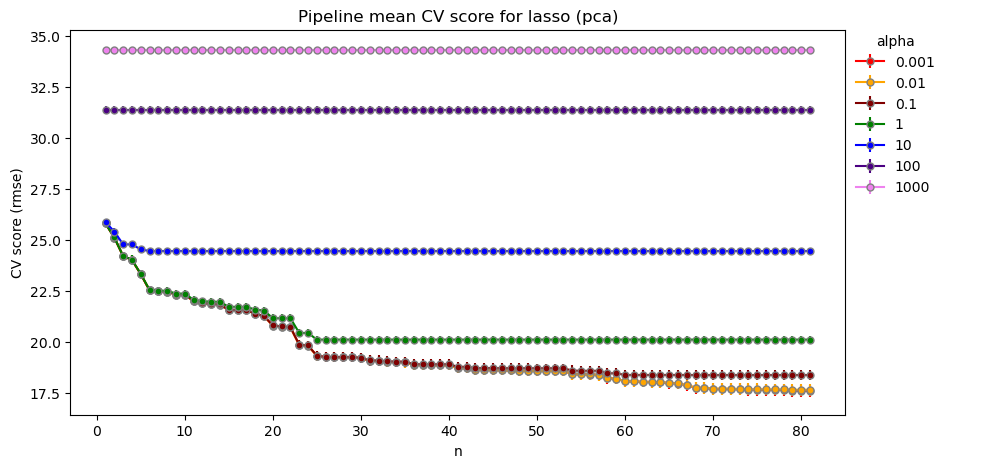

In [602]:
result = pd.DataFrame({'alpha':lasso_pca_cv.cv_results_['param_lasso__alpha'], 
                       'n':lasso_pca_cv.cv_results_['param_pca__n_components'],
                       'mean':-lasso_pca_cv.cv_results_['mean_test_score'], 
                       'std':lasso_pca_cv.cv_results_['std_test_score']})
plt.figure(figsize=(10,5))
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
colors = ['red', 'orange', 'maroon', 'green', 'blue', 'indigo', 'violet']
color_map = dict(zip(alpha, colors))
for i in alpha:
    plt.errorbar(result.n.loc[result.alpha==i], result['mean'].loc[result.alpha==i], 
                 yerr=result['std'].loc[result.alpha==i],color=color_map[i], 
                 fmt='o-', markersize=5, markeredgecolor='gray',label=f'{i}')
plt.legend(bbox_to_anchor=(1.48, 0.93), bbox_transform=fig.transFigure, title = 'alpha', frameon=False)
plt.ylabel('CV score (rmse)')
plt.xlabel('n')
plt.title('Pipeline mean CV score for lasso (pca)')
plt.show()

## Result from lasso

The best model of lasso is 'lasso__alpha': 0.001, 'selectkbest__k': 81.

In [608]:
y_pred = lasso_k_cv.best_estimator_.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'test rmse: {rmse:.2f}, r2: {r2:.2f}')

test rmse: 17.69, r2: 0.73


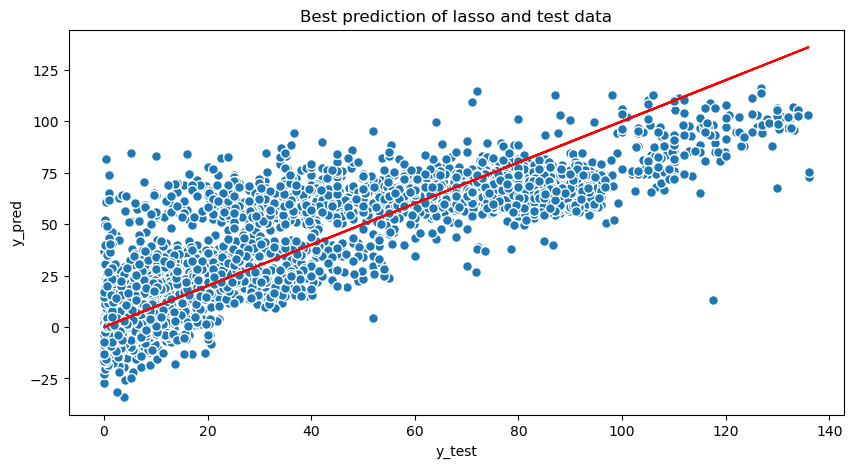

In [575]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, y_pred, s=50, edgecolors='white')
plt.plot(y_test, y_test, 'r-')
plt.xlabel('y_test')
plt.ylabel('y_pred')
plt.title('Best prediction of lasso and test data')
plt.show()

The red line indicate the perfect prediction.

# Ridge<a id='ridge'><a>

## Select k best

In [69]:
steps = [('scaler', StandardScaler()), ('selectkbest', SelectKBest(f_regression)), ('ridge', Ridge())]
pipeline = Pipeline(steps)
k = [k for k in range(1, X_train.shape[1]+1)]
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
parameters = {'selectkbest__k':k, 'ridge__alpha':alpha}
ridge_k_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
ridge_k_cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('selectkbest',
                                        SelectKBest(score_func=<function f_regression at 0x000001BEDC07D9E0>)),
                                       ('ridge', Ridge())]),
             param_grid={'ridge__alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29,
                                            30, ...]},
             scoring='neg_root_mean_squared_error')

In [576]:
ridge_k_cv.best_params_, -ridge_k_cv.best_score_

({'ridge__alpha': 0.1, 'selectkbest__k': 81}, 17.57448472828448)

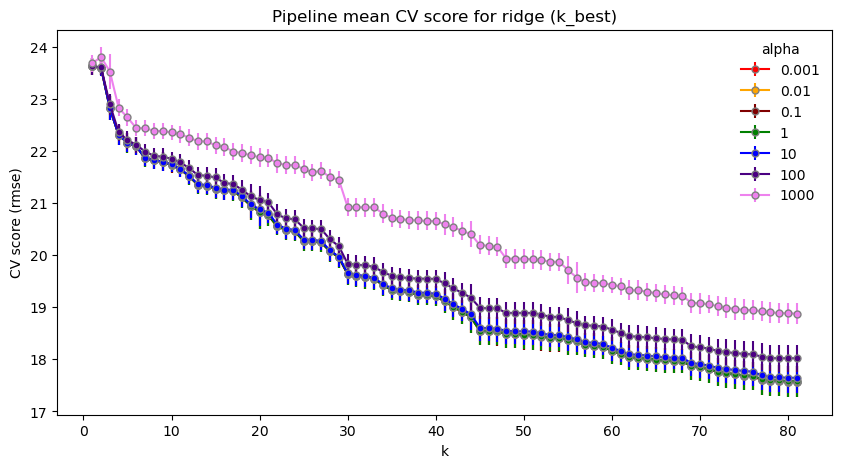

In [593]:
result = pd.DataFrame({'alpha':ridge_k_cv.cv_results_['param_ridge__alpha'], 'k':ridge_k_cv.cv_results_['param_selectkbest__k'],
                       'mean':-ridge_k_cv.cv_results_['mean_test_score'], 'std':ridge_k_cv.cv_results_['std_test_score']})
plt.figure(figsize=(10,5))
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
colors = ['red', 'orange', 'maroon', 'green', 'blue', 'indigo', 'violet']
color_map = dict(zip(alpha, colors))
for i in alpha:
    plt.errorbar(result.k.loc[result.alpha==i], result['mean'].loc[result.alpha==i], 
                 yerr=result['std'].loc[result.alpha==i],color=color_map[i], 
                 fmt='o-', markersize=5, markeredgecolor='gray',label=f'{i}')
plt.legend(loc='best', title = 'alpha', frameon=False)
plt.ylabel('CV score (rmse)')
plt.xlabel('k')
plt.title('Pipeline mean CV score for ridge (k_best)')
plt.show()

In [73]:
result = pd.DataFrame({'alpha':ridge_k_cv.cv_results_['param_ridge__alpha'], 'k':ridge_k_cv.cv_results_['param_selectkbest__k'],
                       'mean':-ridge_k_cv.cv_results_['mean_test_score'], 'std':ridge_k_cv.cv_results_['std_test_score']})
fig = px.scatter(result, x='k', y='mean', error_y='std', color='alpha')
fig.update_layout(template = 'plotly', title='Pipeline mean CV score',yaxis_title='CV score (rmse)',xaxis_title='k')
fig.show()

Check coefficient

In [595]:
coef = ridge_k_cv.best_estimator_.named_steps.ridge.coef_
coef_df = pd.DataFrame({'feature': X_train.columns, 'coefficient': coef})
topten_ridge = coef_df.nlargest(10, 'coefficient')
topten_ridge

,feature,coefficient
22,wtd_mean_atomic_radius,84.564291
49,std_ElectronAffinity,27.468260
75,entropy_Valence,27.338268
72,wtd_mean_Valence,26.638307
25,entropy_atomic_radius,24.749576
62,wtd_mean_ThermalConductivity,23.926034
1,mean_atomic_mass,23.143624
17,range_fie,22.903820
73,gmean_Valence,22.295675
54,wtd_gmean_FusionHeat,21.006618


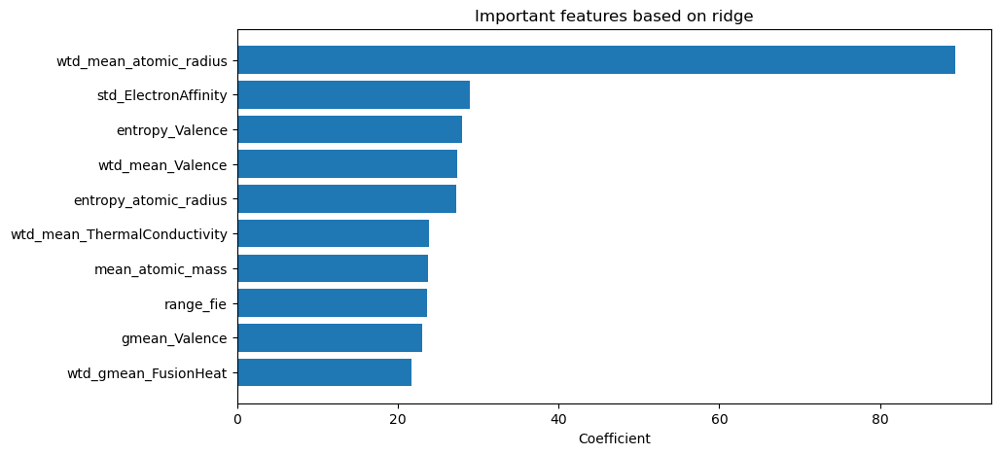

In [597]:
plt.figure(figsize=(10,5))
plt.barh(topten_ridge.feature[::-1], topten_ols.coefficient[::-1])
plt.xlabel('Coefficient')
plt.title('Important features based on ridge')
plt.show()

The most important feature is __weighted mean atomic radius__.

In [784]:
fig = px.bar(x=topten_ridge.coefficient[::-1], y=topten_ridge.feature[::-1], text_auto='.4')
fig.update_layout(template = 'plotly', title='Important features based on Ridge',yaxis_title='Feature',xaxis_title='Coeffient')
fig.show()

## PCA

In [77]:
steps = [('scaler', StandardScaler()), ('pca', PCA()), ('ridge', Ridge())]
pipeline = Pipeline(steps)
n = [n for n in range(1, X_train.shape[1]+1)]
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
parameters = {'pca__n_components':n, 'ridge__alpha':alpha}
ridge_pca_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
ridge_pca_cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()), ('ridge', Ridge())]),
             param_grid={'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                               11, 12, 13, 14, 15, 16, 17, 18,
                                               19, 20, 21, 22, 23, 24, 25, 26,
                                               27, 28, 29, 30, ...],
                         'ridge__alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
             scoring='neg_root_mean_squared_error')

In [600]:
ridge_pca_cv.best_params_, -ridge_pca_cv.best_score_

({'pca__n_components': 81, 'ridge__alpha': 0.1}, 17.57448472828453)

No improvement.

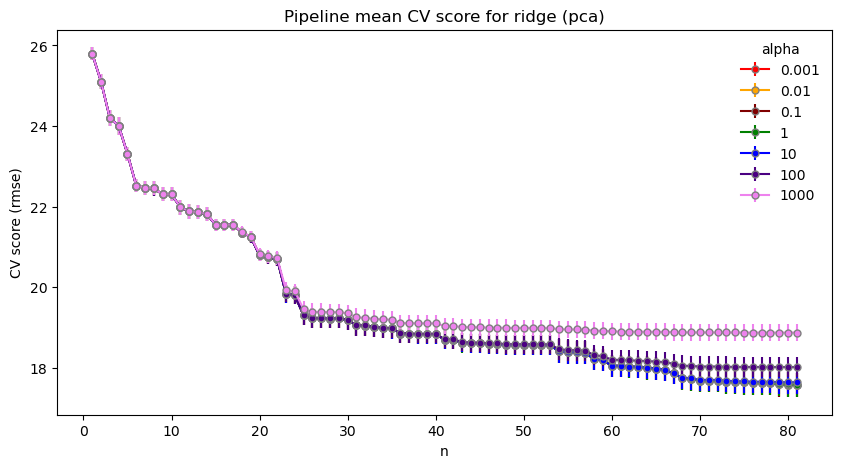

In [604]:
result = pd.DataFrame({'alpha':ridge_pca_cv.cv_results_['param_ridge__alpha'], 
                       'n':ridge_pca_cv.cv_results_['param_pca__n_components'],
                       'mean':-ridge_pca_cv.cv_results_['mean_test_score'], 
                       'std':ridge_pca_cv.cv_results_['std_test_score']})
plt.figure(figsize=(10,5))
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
colors = ['red', 'orange', 'maroon', 'green', 'blue', 'indigo', 'violet']
color_map = dict(zip(alpha, colors))
for i in alpha:
    plt.errorbar(result.n.loc[result.alpha==i], result['mean'].loc[result.alpha==i], 
                 yerr=result['std'].loc[result.alpha==i],color=color_map[i], 
                 fmt='o-', markersize=5, markeredgecolor='gray',label=f'{i}')
plt.legend(loc='best', title = 'alpha', frameon=False)
plt.ylabel('CV score (rmse)')
plt.xlabel('n')
plt.title('Pipeline mean CV score for ridge (pca)')
plt.show()

In [85]:
result = pd.DataFrame({'alpha':ridge_pca_cv.cv_results_['param_ridge__alpha'], 'n':ridge_pca_cv.cv_results_['param_pca__n_components'],
                       'mean':-ridge_pca_cv.cv_results_['mean_test_score'], 'std':ridge_pca_cv.cv_results_['std_test_score']})
fig = px.scatter(result, x='n', y='mean', error_y='std', color='alpha')
fig.update_layout(template = 'plotly', title='Pipeline mean CV score',yaxis_title='CV score (rmse)',xaxis_title='n')
fig.show()

## Result from ridge

The best model of ride is 'ridge__alpha': 0.1, 'selectkbest__k': 81.

In [606]:
y_pred = ridge_k_cv.best_estimator_.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'test rmse: {rmse:.2f}, r2: {r2:.2f}')

test rmse: 17.68, r2: 0.73


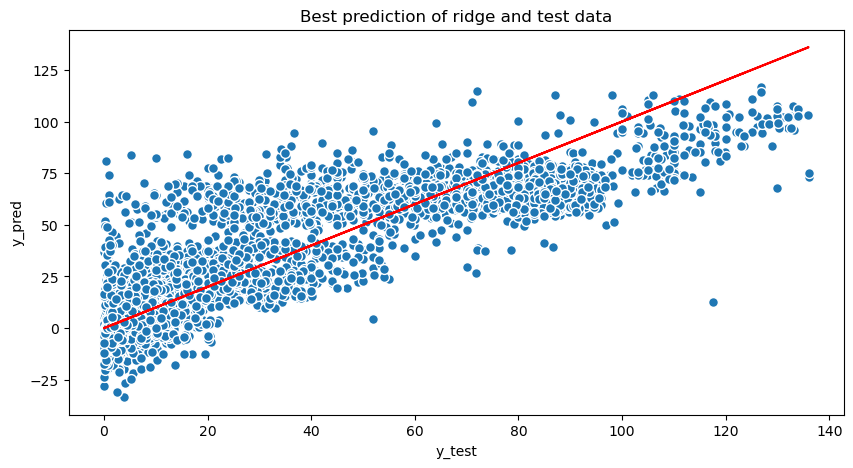

In [607]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, y_pred, s=50, edgecolors='white')
plt.plot(y_test, y_test, 'r-')
plt.xlabel('y_test')
plt.ylabel('y_pred')
plt.title('Best prediction of ridge and test data')
plt.show()

The red line indicate the perfect prediction.

# XGBoost (tree)<a id='xgbtree'><a>

Try select k best feature without hyperparameter optimization

In [165]:
steps = [('selectkbest', SelectKBest(f_regression)), ('xgb', xgb.XGBRegressor(objective='reg:squarederror'))]
pipeline = Pipeline(steps)
k = [k for k in range(1, X_train.shape[1]+1)]
parameters = {'selectkbest__k':k}
xgb_k_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
xgb_k_cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('selectkbest',
                                        SelectKBest(score_func=<function f_regression at 0x000001BEDC07D9E0>)),
                                       ('xgb',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     early_stopping_rounds=None,
                                                     enable_categorical=Fa...
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     n_estimators=100,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     predictor=None,
                                                     random_state=None, ...))]),
             param_grid={'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29,
                                            30, ...]},
             scoring='neg_root_mean_squared_error')

In [617]:
xgb_k_cv.best_params_, -xgb_k_cv.best_score_

({'selectkbest__k': 80}, 9.938745447600528)

The score is better than linear model already.

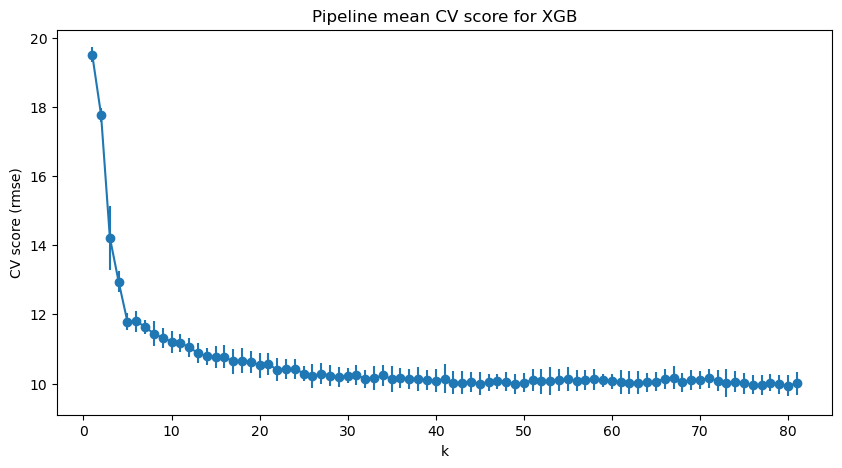

In [619]:
score_mean = -xgb_k_cv.cv_results_['mean_test_score']
score_std = xgb_k_cv.cv_results_['std_test_score']

plt.figure(figsize=(10,5))
plt.errorbar(k, score_mean, yerr=score_std, fmt='o-')
plt.ylabel('CV score (rmse)')
plt.xlabel('k')
plt.title('Pipeline mean CV score for XGB')
plt.show()

In [639]:
xgb_k_cv.cv_results_['param_selectkbest__k'].data[xgb_k_cv.cv_results_['rank_test_score']<=3]

array([76, 77, 80], dtype=object)

In [742]:
steps = [('selectkbest', SelectKBest(mutual_info_regression)), ('xgb', xgb.XGBRegressor())]
pipeline = Pipeline(steps)
k = [k for k in range(1, X_train.shape[1]+1)]
parameters = {'selectkbest__k':k}
xgb_mi_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
xgb_mi_cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('selectkbest',
                                        SelectKBest(score_func=<function mutual_info_regression at 0x000001BEDC05F600>)),
                                       ('xgb',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     early_stopping_rounds=None,
                                                     enable_cate...
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     n_estimators=100,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     predictor=None,
                                                     random_state=None, ...))]),
             param_grid={'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29,
                                            30, ...]},
             scoring='neg_root_mean_squared_error')

In [743]:
xgb_mi_cv.best_params_, -xgb_mi_cv.best_score_

({'selectkbest__k': 59}, 9.900107674863168)

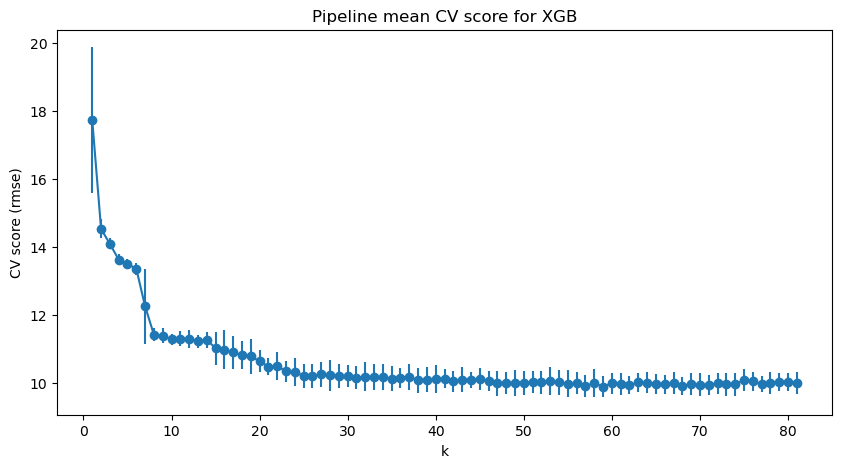

In [744]:
score_mean = -xgb_mi_cv.cv_results_['mean_test_score']
score_std = xgb_mi_cv.cv_results_['std_test_score']

plt.figure(figsize=(10,5))
plt.errorbar(k, score_mean, yerr=score_std, fmt='o-')
plt.ylabel('CV score (rmse)')
plt.xlabel('k')
plt.title('Pipeline mean CV score for XGB')
plt.show()

Try optimizing the best 3 values of k __(76, 77, 80)__.

Since there are many hyperparameters, use BayesianOptimization.

Define optimatiation function with mean of cross_val_score

In [191]:
def generate_xgb_eval(X_train, y_train):
    def xgb_eval(n_estimators:int, max_depth:int, learning_rate:float, gamma:float, reg_alpha:float, reg_lambda:float, 
             subsample:float, colsample_bytree:float)->float:
        # n_estimators and max_depth has to be int.
        xgb_param_grid = {'objective':'reg:squarederror', 'n_estimators':int(n_estimators), 'max_depth':int(max_depth),
                      'learning_rate':learning_rate, 'gamma':gamma, 'reg_alpha':reg_alpha, 'reg_lambda':reg_lambda,
                     'subsample':subsample, 'colsample_bytree':colsample_bytree}
        xgb_reg = xgb.XGBRegressor(**xgb_param_grid)
        score = cross_val_score(xgb_reg, X_train, y_train, scoring='neg_root_mean_squared_error', cv=kf)
        return score.mean()
    return xgb_eval

Ranges of hyperparameters

In [341]:
xgb_param_grid = {'n_estimators':(100,300.99), 'max_depth':(1,20.99),
                      'learning_rate':(0.01,1), 'gamma':(0.0 ,1.0), 'reg_alpha':(0.0,1.0), 'reg_lambda':(0.0,1.0),
                     'subsample':(0.01, 1.0), 'colsample_bytree':(0.01, 1.0)}

Optimize 

In [745]:
mibest = SelectKBest(score_func=mutual_info_regression, k=59)
X_train_mi = mibest.fit_transform(X_train, y_train)
X_test_mi = mibest.transform(X_test)
xgb_eval = generate_xgb_eval(X_train_mi, y_train)
xgb_opt_mi = BayesianOptimization(xgb_eval, xgb_param_grid, random_state=0)
xgb_opt_mi.maximize(n_iter=5, init_points=5)

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.29    | 0.5533    | 0.7152    | 0.6067    | 11.89     | 185.2     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -1.327e+0 | 0.964     | 0.3834    | 0.7938    | 11.57     | 214.2     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -17.84    | 0.03002   | 0.8326    | 0.7804    | 18.39     | 296.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.13    | 0.1271    | 0.6399    | 0.1519    | 19.88     | 204.9     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.369    | 0.4616    | 0.5684    | 0.0286    | 13.35     | 223.0     | 0.6169    | 0.9437    | 0.685     |
| 6         | -27.81    | 0.6182    | 0.8174    | 0.7124    | 15.93     | 256.0     | 0.7037    | 0.1164    | 0.3405    |
| 7         | -12.29    

In [746]:
params = xgb_opt_mi.max['params']
params['n_estimators'] = int(params['n_estimators'])
params['max_depth'] = int(params['max_depth'])
xgb_reg = xgb.XGBRegressor(**params)
xgb_reg.fit(X_train_mi, y_train)
y_pred = xgb_reg.predict(X_test_mi)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'test rmse: {rmse:.2f}, r2: {r2:.2f}')

test rmse: 9.30, r2: 0.93


In [747]:
scaler = StandardScaler()
X_train_mi_scaled = scaler.fit_transform(X_train_mi)
X_test_mi_scaled = scaler.transform(X_test_mi)

In [748]:
steps = [('pca', PCA()), ('xgb', xgb.XGBRegressor(objective='reg:squarederror'))]
pipeline = Pipeline(steps)
n = [n for n in range(1, X_train.shape[1]+1)]
parameters = {'pca__n_components':n}
xgb_mi_pca_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
xgb_mi_pca_cv.fit(X_train_mi_scaled, y_train)

C:\Users\mtdra\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning:


110 fits failed out of a total of 405.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mtdra\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mtdra\anaconda3\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\mtdra\anaconda3\Lib\site-packages\sklearn\pipeline.py", line 416, in fit
    Xt = self._fit(X, y, **

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('pca', PCA()),
                                       ('xgb',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     early_stopping_rounds=None,
                                                     enable_categorical=False,
                                                     eval_metric=None,
                                                     feature_types=None,
                                                     gamma=None, gpu_id=None,
                                                     grow_p...
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     n_estimators=100,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     predictor=None,
                                                     random_state=None, ...))]),
             param_grid={'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                               11, 12, 13, 14, 15, 16, 17, 18,
                                               19, 20, 21, 22, 23, 24, 25, 26,
                                               27, 28, 29, 30, ...]},
             scoring='neg_root_mean_squared_error')

In [640]:
xgb_k_score = []
for i in [76, 77, 80]:
    kbest = SelectKBest(score_func=f_regression, k=i)
    X_train_k = kbest.fit_transform(X_train, y_train)
    xgb_eval = generate_xgb_eval(X_train_k, y_train)
    xgb_opt = BayesianOptimization(xgb_eval, xgb_param_grid, random_state=0)
    xgb_opt.maximize(n_iter=20, init_points=10)
    xgb_k_score.append((i, xgb_opt.max))

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.46    | 0.5533    | 0.7152    | 0.6067    | 11.89     | 185.2     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -5.702e+0 | 0.964     | 0.3834    | 0.7938    | 11.57     | 214.2     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -17.62    | 0.03002   | 0.8326    | 0.7804    | 18.39     | 296.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.03    | 0.1271    | 0.6399    | 0.1519    | 19.88     | 204.9     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.391    | 0.4616    | 0.5684    | 0.0286    | 13.35     | 223.0     | 0.6169    | 0.9437    | 0.685     |
| 6         | -16.58    | 0.3659    | 0.437     | 0.7007    | 2.204     | 234.0     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -64.49    

| 9         | -12.9     | 0.2046    | 0.3687    | 0.8228    | 2.941     | 268.4     | 0.0961    | 0.9765    | 0.474     |
| 10        | -14.89    | 0.977     | 0.6048    | 0.7419    | 1.783     | 156.8     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -29.27    | 0.6182    | 0.8174    | 0.7124    | 15.93     | 256.0     | 0.7037    | 0.1164    | 0.3405    |
| 12        | -12.67    | 0.7682    | 0.6519    | 0.7053    | 13.49     | 241.8     | 0.8112    | 0.7084    | 0.8466    |
| 13        | -240.0    | 0.3707    | 0.518     | 0.6367    | 11.79     | 287.0     | 0.7627    | 0.3343    | 0.1627    |
| 14        | -28.98    | 0.6099    | 0.3378    | 0.7345    | 20.91     | 164.4     | 0.6407    | 0.2472    | 0.3173    |
| 15        | -12.77    | 0.5918    | 0.1317    | 0.1487    | 2.353     | 296.0     | 0.8089    | 0.6088    | 0.09632   |
| 16        | -10.73    | 0.8627    | 0.4351    | 0.4046    | 12.58     | 220.7     | 0.3928    | 0.3501    | 0.8613    |
| 17        | -10.15    

| 18        | -14.16    | 0.253     | 0.45      | 0.462     | 7.081     | 291.7     | 0.5482    | 0.7691    | 0.255     |
| 19        | -13.32    | 0.5932    | 0.07447   | 0.8026    | 18.33     | 289.8     | 0.06825   | 0.9809    | 0.8753    |
| 20        | -27.82    | 0.3962    | 0.5895    | 0.8337    | 7.603     | 238.2     | 0.2708    | 0.1379    | 0.3273    |
| 21        | -14.42    | 0.3137    | 0.7975    | 0.52      | 8.224     | 231.4     | 0.762     | 0.1036    | 0.3988    |
| 22        | -28.11    | 0.5567    | 0.02711   | 0.8308    | 14.44     | 235.1     | 0.712     | 0.2047    | 0.4246    |
| 23        | -35.64    | 0.5396    | 0.675     | 0.7585    | 13.45     | 249.2     | 0.5781    | 0.1063    | 0.3226    |
| 24        | -15.21    | 0.7366    | 0.7519    | 0.6989    | 7.204     | 245.5     | 0.3618    | 0.9299    | 0.3769    |
| 25        | -11.2     | 0.845     | 0.7353    | 0.4497    | 8.049     | 253.7     | 0.03999   | 0.9619    | 0.5702    |
| 26        | -13.84    

In [641]:
xgb_k_score

[(76,
  {'target': -9.39116186459585,
   'params': {'colsample_bytree': 0.4615888288943831,
    'gamma': 0.5684339488686485,
    'learning_rate': 0.028601902431991594,
    'max_depth': 13.346533586546782,
    'n_estimators': 223.0251193099795,
    'reg_alpha': 0.6169339968747569,
    'reg_lambda': 0.9437480785146242,
    'subsample': 0.6850020961124486}}),
 (77,
  {'target': -9.393148635893402,
   'params': {'colsample_bytree': 0.4615888288943831,
    'gamma': 0.5684339488686485,
    'learning_rate': 0.028601902431991594,
    'max_depth': 13.346533586546782,
    'n_estimators': 223.0251193099795,
    'reg_alpha': 0.6169339968747569,
    'reg_lambda': 0.9437480785146242,
    'subsample': 0.6850020961124486}}),
 (80,
  {'target': -9.362445268416419,
   'params': {'colsample_bytree': 0.4615888288943831,
    'gamma': 0.5684339488686485,
    'learning_rate': 0.028601902431991594,
    'max_depth': 13.346533586546782,
    'n_estimators': 223.0251193099795,
    'reg_alpha': 0.6169339968747569,

The best k is 80, and the rmse is 9.36. 

Fit with k=80 again to get feature importances.

In [796]:
params = xgb_k_score[2][1]['params']
params['n_estimators'] = int(params['n_estimators'])
params['max_depth'] = int(params['max_depth'])
kbest = SelectKBest(score_func=f_regression, k=80)
X_train_k = kbest.fit_transform(X_train, y_train)
xgb_reg = xgb.XGBRegressor(**params)
xgb_reg.fit(X_train_k, y_train)
#y_pred = xgb_reg.predict(X_test)
#rmse = mean_squared_error(y_test, y_pred, squared=False)
#r2 = r2_score(y_test, y_pred)
#print(f'test rmse: {rmse:.2f}, r2: {r2:.2f}')

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.4615888288943831, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.5684339488686485, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.028601902431991594, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=13, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=223, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [763]:
importances = xgb_reg.feature_importances_
importance_df = pd.DataFrame({'feature': X_train.drop('gmean_fie', axis=1).columns, 'importance': importances})
topten_xgb = importance_df.nlargest(10, 'importance')
topten_xgb

,feature,importance
66,range_ThermalConductivity,0.590229
26,range_atomic_radius,0.098240
75,wtd_entropy_Valence,0.032018
74,entropy_Valence,0.027482
69,wtd_std_ThermalConductivity,0.025536
63,wtd_gmean_ThermalConductivity,0.020949
73,wtd_gmean_Valence,0.011467
38,std_Density,0.009571
47,wtd_range_ElectronAffinity,0.008988
67,wtd_range_ThermalConductivity,0.008107


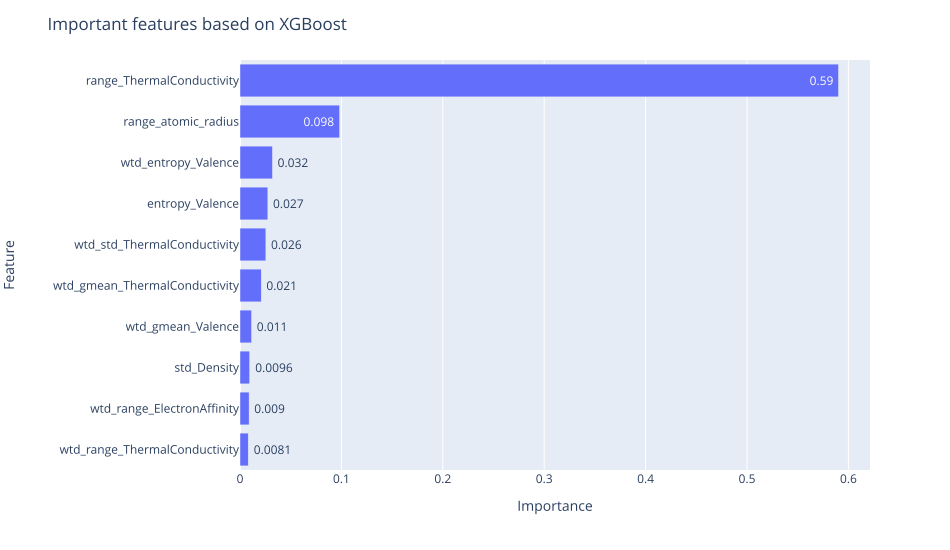

In [786]:
fig = px.bar(x=topten_xgb.importance[::-1], y=topten_xgb.feature[::-1], text_auto='.2', width=950, height=550)
fig.update_layout(template = 'plotly', title='Important features based on XGBoost',yaxis_title='Feature',xaxis_title='Importance')
fig.show('svg')

In [797]:
X_test_k = kbest.transform(X_test)
y_pred = xgb_reg.predict(X_test_k)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'test rmse: {rmse:.2f}, r2: {r2:.2f}')

test rmse: 9.27, r2: 0.93


In [798]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test, y=y_pred, name='data',mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))
fig.add_trace(go.Scatter(x=y_test, y=y_test, name='perfect prediction',mode='lines', line=dict(dash='dash', color='red', width=3)))
fig.add_annotation(x=70, y=0, text=f'rmse = {rmse:.2f}', showarrow=False,  font={'size':17})
fig.update_layout(template = 'simple_white', title='Best prediction of XGBoost and test data',yaxis_title='y_pred',xaxis_title='y_test', showlegend=True)
fig.show()

In [152]:
# Get feature importances
importances = xgb_reg.feature_importances_

# Convert feature importances into a DataFrame
importance_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance in descending order
topten = importance_df.nlargest(10, 'importance')
topten

,feature,importance
67,range_ThermalConductivity,0.447885
27,range_atomic_radius,0.119552
70,wtd_std_ThermalConductivity,0.065749
69,std_ThermalConductivity,0.062783
76,wtd_entropy_Valence,0.026558
64,wtd_gmean_ThermalConductivity,0.017030
72,wtd_mean_Valence,0.015231
73,gmean_Valence,0.015064
50,wtd_std_ElectronAffinity,0.013512
74,wtd_gmean_Valence,0.013054


In [153]:
fig = px.bar(x=topten.importance[::-1], y=topten.feature[::-1], text_auto='.2')
fig.update_layout(template = 'plotly', title='Important features based on XGBoost',yaxis_title='Feature',xaxis_title='Importance')
fig.show()

In [194]:
kbest = SelectKBest(score_func=f_regression, k=80)
X_train_k = kbest.fit_transform(X_train, y_train)
xgb_eval = generate_xgb_eval(X_new, y_train)
xgb_opt = BayesianOptimization(xgb_eval, xgb_param_grid, random_state=0)
xgb_opt.maximize(n_iter=20, init_points=10)

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.28    | 0.5533    | 0.7152    | 0.6067    | 11.89     | 185.2     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -4.945e+0 | 0.964     | 0.3834    | 0.7938    | 11.57     | 214.2     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -17.64    | 0.03002   | 0.8326    | 0.7804    | 18.39     | 296.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.02    | 0.1271    | 0.6399    | 0.1519    | 19.88     | 204.9     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.362    | 0.4616    | 0.5684    | 0.0286    | 13.35     | 223.0     | 0.6169    | 0.9437    | 0.685     |
| 6         | -17.12    | 0.3659    | 0.437     | 0.7007    | 2.204     | 234.0     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -51.37    

In [155]:
params = xgb_opt.max['params']
params['n_estimators'] = int(params['n_estimators'])
params['max_depth'] = int(params['max_depth'])
xgb_reg = xgb.XGBRegressor(**params)
xgb_reg.fit(X_train, y_train)
y_pred = xgb_reg.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'test rmse: {rmse:.2f}, r2: {r2:.2f}')

test rmse: 9.35, r2: 0.92


In [509]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test, y=y_pred, mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))
fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', line=dict(dash='dash', color='red', width=3)))
fig.add_annotation(x=70, y=0, text=f'rmse = {rmse:.2f}', showarrow=False,  font={'size':17})
fig.update_layout(template = 'simple_white', title='XGBoost',yaxis_title='y_pred',xaxis_title='y_test', showlegend=False)
fig.show()

## PCA

Try using pca without hyperparameter optimization.

In [306]:
# scale X by mean and sd
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [337]:
steps = [('pca', PCA()), ('xgb', xgb.XGBRegressor(objective='reg:squarederror'))]
pipeline = Pipeline(steps)
n = [n for n in range(1, X_train.shape[1]+1)]
parameters = {'pca__n_components':n}
xgb_pca_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
xgb_pca_cv.fit(X_train_scaled, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('pca', PCA()),
                                       ('xgb',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     early_stopping_rounds=None,
                                                     enable_categorical=False,
                                                     eval_metric=None,
                                                     feature_types=None,
                                                     gamma=None, gpu_id=None,
                                                     grow_p...
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     n_estimators=100,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     predictor=None,
                                                     random_state=None, ...))]),
             param_grid={'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                               11, 12, 13, 14, 15, 16, 17, 18,
                                               19, 20, 21, 22, 23, 24, 25, 26,
                                               27, 28, 29, 30, ...]},
             scoring='neg_root_mean_squared_error')

In [338]:
xgb_pca_cv.best_params_, xgb_pca_cv.best_score_

({'pca__n_components': 78}, -10.623379734746491)

Best n is 78, but score is worse.

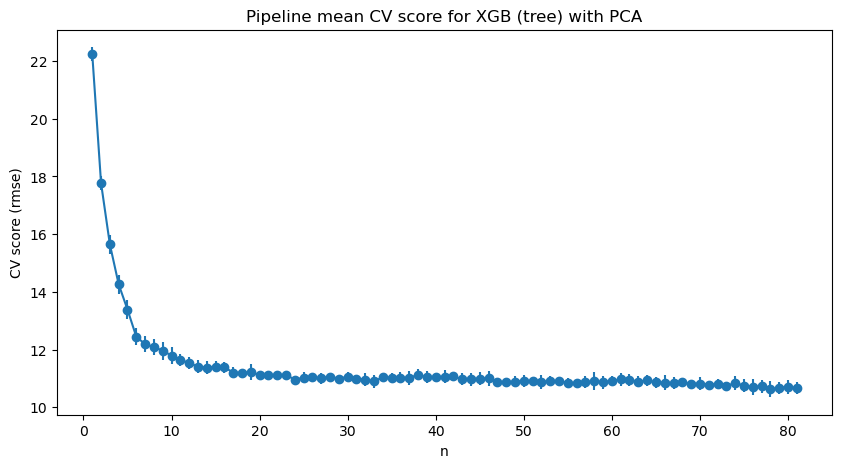

In [339]:
score_mean = -xgb_pca_cv.cv_results_['mean_test_score']
score_std = xgb_pca_cv.cv_results_['std_test_score']

plt.figure(figsize=(10,5))
plt.errorbar(n, score_mean, yerr=score_std, fmt='-o')
plt.ylabel('CV score (rmse)')
plt.xlabel('n')
plt.title('Pipeline mean CV score for XGB (tree) with PCA')
plt.show()

Check explained variance ratio.

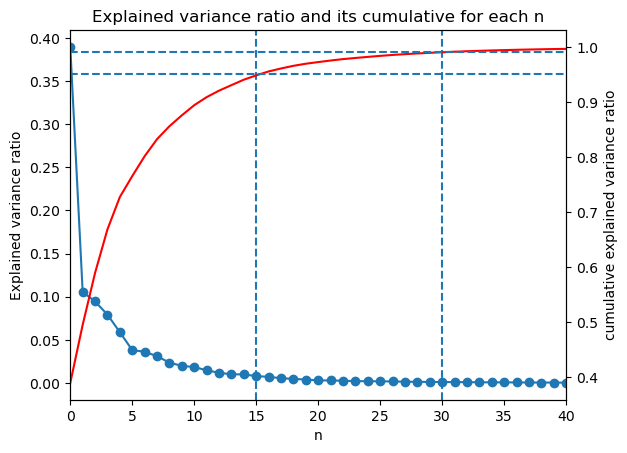

In [340]:
pca = PCA()
pca.fit(X_train_scaled)
exp_var_ratio = pca.explained_variance_ratio_
fig, ax1 = plt.subplots()
ax1.plot(range(0, len(exp_var_ratio)), exp_var_ratio, '-o')
ax1.axvline(15, ls='--')
ax1.axvline(30, ls='--')
ax1.set_xlabel('n')
ax1.set_ylabel('Explained variance ratio')
ax2 = ax1.twinx()
ax2.plot(range(0, len(exp_var_ratio)), exp_var_ratio.cumsum(),'r')
ax2.axhline(0.95, ls='--')
ax2.axhline(0.99, ls='--')
ax2.set_ylabel('cumulative explained variance ratio')
ax1.set_xlim(0,40)
plt.title('Explained variance ratio and its cumulative for each n')
plt.show()

The elbow is at basis 5. Cumulative explained variance of 0.95 and 0.99 are at basis 15 and basis 30, respectively. 

$\therefore$ Try n_components = 6, 16, 31, 78 (best n without hyperopt), 80 (best k), and 81 (no reduction)

In [343]:
xgb_pca_score = []
for i in [6, 16, 31, 78, 80, 81]:
    pca = PCA(n_components=i)
    X_train_pca = pca.fit_transform(X_train_scaled)
    xgb_eval = generate_xgb_eval(X_train_pca, y_train)
    xgb_opt = BayesianOptimization(xgb_eval, xgb_param_grid, random_state=0)
    xgb_opt.maximize(n_iter=20, init_points=10)
    xgb_pca_score.append((i, xgb_opt.max))

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -15.07    | 0.5533    | 0.7152    | 0.6067    | 11.89     | 185.2     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -1.928e+0 | 0.964     | 0.3834    | 0.7938    | 11.57     | 214.2     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -29.57    | 0.03002   | 0.8326    | 0.7804    | 18.39     | 296.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -23.64    | 0.1271    | 0.6399    | 0.1519    | 19.88     | 204.9     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -13.78    | 0.4616    | 0.5684    | 0.0286    | 13.35     | 223.0     | 0.6169    | 0.9437    | 0.685     |
| 6         | -18.61    | 0.3659    | 0.437     | 0.7007    | 2.204     | 234.0     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -45.83    

| 9         | -16.2     | 0.2046    | 0.3687    | 0.8228    | 2.941     | 268.4     | 0.0961    | 0.9765    | 0.474     |
| 10        | -18.72    | 0.977     | 0.6048    | 0.7419    | 1.783     | 156.8     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -33.79    | 0.6182    | 0.8174    | 0.7124    | 15.93     | 256.0     | 0.7037    | 0.1164    | 0.3405    |
| 12        | -13.38    | 0.7682    | 0.6519    | 0.7053    | 13.49     | 241.8     | 0.8112    | 0.7084    | 0.8466    |
| 13        | -160.0    | 0.3707    | 0.518     | 0.6367    | 11.79     | 287.0     | 0.7627    | 0.3343    | 0.1627    |
| 14        | -33.96    | 0.6099    | 0.3378    | 0.7345    | 20.91     | 164.4     | 0.6407    | 0.2472    | 0.3173    |
| 15        | -15.5     | 0.5918    | 0.1317    | 0.1487    | 2.353     | 296.0     | 0.8089    | 0.6088    | 0.09632   |
| 16        | -11.86    | 0.8627    | 0.4351    | 0.4046    | 12.58     | 220.7     | 0.3928    | 0.3501    | 0.8613    |
| 17        | -12.96    

| 18        | -12.03    | 0.7113    | 0.6631    | 0.3207    | 7.231     | 292.1     | 0.2172    | 0.551     | 0.3784    |
| 19        | -14.95    | 0.5932    | 0.07447   | 0.8026    | 18.33     | 289.8     | 0.06825   | 0.9809    | 0.8753    |
| 20        | -36.18    | 0.3962    | 0.5895    | 0.8337    | 7.603     | 238.2     | 0.2708    | 0.1379    | 0.3273    |
| 21        | -18.08    | 0.3137    | 0.7975    | 0.52      | 8.224     | 231.4     | 0.762     | 0.1036    | 0.3988    |
| 22        | -31.84    | 0.5567    | 0.02711   | 0.8308    | 14.44     | 235.1     | 0.712     | 0.2047    | 0.4246    |
| 23        | -55.15    | 0.5246    | 0.6707    | 0.7614    | 13.29     | 249.2     | 0.5577    | 0.07662   | 0.2957    |
| 24        | -16.91    | 0.7366    | 0.7519    | 0.6989    | 7.204     | 245.5     | 0.3618    | 0.9299    | 0.3769    |
| 25        | -12.11    | 0.845     | 0.7353    | 0.4497    | 8.049     | 253.7     | 0.03999   | 0.9619    | 0.5702    |
| 26        | -16.54    

| 27        | -17.01    | 0.766     | 0.04057   | 0.118     | 1.427     | 249.6     | 0.1496    | 0.754     | 0.6998    |
| 28        | -8.676e+0 | 0.6533    | 0.9331    | 0.7983    | 10.14     | 261.3     | 0.6338    | 0.8674    | 0.08417   |
| 29        | -10.54    | 0.7658    | 0.5242    | 0.01271   | 19.85     | 251.1     | 0.4016    | 0.8604    | 0.5451    |
| 30        | -16.38    | 0.7899    | 0.6598    | 0.3356    | 20.01     | 244.0     | 0.266     | 0.7397    | 0.1969    |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -12.53    | 0.5533    | 0.7152    | 0.6067    | 11.89     | 185.2     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -1.807e+0 | 0.964     | 0.3834    | 0.7938    | 11.57     | 214.2     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -25.9     

| 4         | -12.5     | 0.1271    | 0.6399    | 0.1519    | 19.88     | 204.9     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -10.19    | 0.4616    | 0.5684    | 0.0286    | 13.35     | 223.0     | 0.6169    | 0.9437    | 0.685     |
| 6         | -21.15    | 0.3659    | 0.437     | 0.7007    | 2.204     | 234.0     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -53.28    | 0.3223    | 0.3637    | 0.5745    | 9.768     | 298.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -17.62    | 0.6566    | 0.2533    | 0.4716    | 5.886     | 132.0     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -15.89    | 0.2046    | 0.3687    | 0.8228    | 2.941     | 268.4     | 0.0961    | 0.9765    | 0.474     |
| 10        | -17.48    | 0.977     | 0.6048    | 0.7419    | 1.783     | 156.8     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -33.46    | 0.6182    | 0.8174    | 0.7124    | 15.93     | 256.0     | 0.7037    | 0.1164    | 0.3405    |
| 12        | -13.69    

In [344]:
xgb_pca_score

[(6,
  {'target': -12.616171428913002,
   'params': {'colsample_bytree': 0.8626610109256917,
    'gamma': 0.4351109251114832,
    'learning_rate': 0.40458494422283386,
    'max_depth': 12.577259028758615,
    'n_estimators': 220.68730298399032,
    'reg_alpha': 0.39275989702326575,
    'reg_lambda': 0.350133466747809,
    'subsample': 0.8613067430063812}}),
 (16,
  {'target': -10.711405221958051,
   'params': {'colsample_bytree': 0.4615888288943831,
    'gamma': 0.5684339488686485,
    'learning_rate': 0.028601902431991594,
    'max_depth': 13.346533586546782,
    'n_estimators': 223.0251193099795,
    'reg_alpha': 0.6169339968747569,
    'reg_lambda': 0.9437480785146242,
    'subsample': 0.6850020961124486}}),
 (31,
  {'target': -10.285255278354631,
   'params': {'colsample_bytree': 0.4615888288943831,
    'gamma': 0.5684339488686485,
    'learning_rate': 0.028601902431991594,
    'max_depth': 13.346533586546782,
    'n_estimators': 223.0251193099795,
    'reg_alpha': 0.61693399687475

Best n is stil 80, and the score with pca is still not very good.

# Save best model

In [158]:
xgb_noscaling_model = xgb_reg
xgb_noscaling_model.version = '1.0'
xgb_noscaling_model.python_version = sys.version
xgb_noscaling_model.pandas_version = pd.__version__
xgb_noscaling_model.numpy_version = np.__version__
xgb_noscaling_model.sklearn_version = sklearn_version
xgb_noscaling_model.X_columns = [col for col in X_train.columns]
xgb_noscaling_model.build_datetime = datetime.datetime.now()

modelpath = '../models'
dump(xgb_noscaling_model, f'{modelpath}/xgb_noscaling_model.joblib')

['../models/xgb_noscaling_model.joblib']

## XGBoost

In [81]:
xgb_param_grid = {'n_estimators':(100,200), 'max_depth':(1,10),
                      'learning_rate':(0.01,1), 'gamma':(0.0 ,1.0), 'reg_alpha':(0.0,1.0), 'reg_lambda':(0.0,1.0),
                     'subsample':(0.01, 1.0), 'colsample_bytree':(0.01, 1.0)}
xgb_eval = generate_xgb_eval(X_train_scaled, y_train)
xgb_opt = BayesianOptimization(xgb_eval, xgb_param_grid)
xgb_opt.maximize(n_iter=20, init_points=10)

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -19.27    | 0.7151    | 0.4503    | 0.9739    | 3.017     | 158.5     | 0.616     | 0.3825    | 0.2864    |
| 2         | -12.17    | 0.3837    | 0.6514    | 0.1159    | 3.127     | 134.1     | 0.798     | 0.06093   | 0.9868    |
| 3         | -16.35    | 0.8256    | 0.7398    | 0.08216   | 1.913     | 167.1     | 0.4665    | 0.7469    | 0.475     |
| 4         | -15.36    | 0.0109    | 0.5066    | 0.3777    | 5.397     | 147.2     | 0.7003    | 0.2948    | 0.1604    |
| 5         | -12.57    | 0.4034    | 0.4536    | 0.6335    | 9.546     | 178.3     | 0.9547    | 0.147     | 0.7488    |
| 6         | -9.718    | 0.4735    | 0.09169   | 0.06591   | 8.921     | 155.1     | 0.07796   | 0.7342    | 0.4725    |
| 7         | -16.03    

In [82]:
xgb_opt.max

{'target': -9.665547744730501,
 'params': {'colsample_bytree': 0.4595836871886012,
  'gamma': 0.558794440744886,
  'learning_rate': 0.10873206587177726,
  'max_depth': 8.636480125140348,
  'n_estimators': 151.9929983439765,
  'reg_alpha': 0.3186426390589968,
  'reg_lambda': 0.060747327699554154,
  'subsample': 0.8997199185452274}}

In [84]:
params = xgb_opt.max['params']
params['n_estimators'] = int(params['n_estimators'])
params['max_depth'] = int(params['max_depth'])
xgb_scaled_reg = xgb.XGBRegressor(**params)
xgb_scaled_reg.fit(X_train_scaled, y_train)
y_pred = xgb_scaled_reg.predict(X_test_scaled)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'rmse: {rmse:.2f}, r2: {r2:.2f}')

rmse: 9.49, r2: 0.92


In [85]:
# Get feature importances
importances = xgb_scaled_reg.feature_importances_

# Convert feature importances into a DataFrame
importance_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance in descending order
topten = importance_df.nlargest(10, 'importance')
topten

,feature,importance
67,range_ThermalConductivity,0.381092
70,wtd_std_ThermalConductivity,0.157349
69,std_ThermalConductivity,0.067206
27,range_atomic_radius,0.044811
17,range_fie,0.019192
73,gmean_Valence,0.018731
44,wtd_gmean_ElectronAffinity,0.017981
50,wtd_std_ElectronAffinity,0.017552
43,gmean_ElectronAffinity,0.015380
9,std_atomic_mass,0.014545


In [86]:
fig = px.bar(x=topten.importance[::-1], y=topten.feature[::-1], text_auto='.2')
fig.update_layout(template = 'plotly', title='Important features based on XGBoost',yaxis_title='Feature',xaxis_title='Importance')
fig.show()

# XGBoost (linear)<a id='xgblinear'><a>

In [360]:
steps = [('selectkbest', SelectKBest(f_regression)), 
         ('xgb_linear', xgb.XGBRegressor(objective='reg:squarederror', booster='gblinear', alpha=1, reg_lambda=1))]
pipeline = Pipeline(steps)
k = [k for k in range(1, X_train.shape[1]+1)]
parameters = {'selectkbest__k':k,'xgb_linear__n_estimators':np.arange(100,800,100), 'alpha':[0, 0.01, 0.1, 1, 10], 
              'reg_lambda':[0, 0.01, 0.1, 1, 10]}
xgb_linear_k_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
xgb_linear_k_cv.fit(X_train_scaled, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('selectkbest',
                                        SelectKBest(score_func=<function f_regression at 0x000001BEDC07D9E0>)),
                                       ('xgb_linear',
                                        XGBRegressor(alpha=1, base_score=None,
                                                     booster='gblinear',
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     early_stopping_rounds=None,...
                                                     max_cat_to_onehot=None,
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     n_estimators=100,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     predictor=None, ...))]),
             param_grid={'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29,
                                            30, ...]},
             scoring='neg_root_mean_squared_error')

In [380]:
xgb_linear_k_cv.best_params_, xgb_linear_k_cv.best_score_

({'selectkbest__k': 81}, -21.66449497362044)

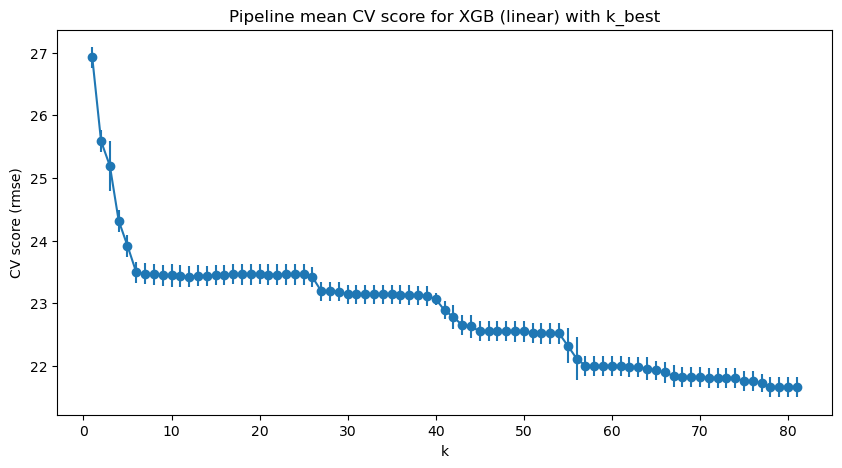

In [387]:
score_mean = -xgb_linear_k_cv.cv_results_['mean_test_score']
score_std = xgb_linear_k_cv.cv_results_['std_test_score']

plt.figure(figsize=(10,5))
plt.errorbar(k, score_mean, yerr=score_std, fmt='-o')
plt.ylabel('CV score (rmse)')
plt.xlabel('k')
plt.title('Pipeline mean CV score for XGB (linear) with k_best')
plt.show()

In [364]:
score_mean[-4:]

array([21.66453926, 21.66449512, 21.66449521, 21.66449497])

The last four valuse are very closed to each other.

In [421]:
xgb_linear_param_grid = {'n_estimators':(100, 800), 'alpha':(0,10), 'reg_lambda':(0,10)}

In [415]:
def generate_xgb_linear_eval(X_train, y_train):
    def xgb_linear_eval(n_estimators:int, alpha:float, reg_lambda:float)->float:
        xgb_param_grid = {'objective':'reg:squarederror', 'booster':'gblinear','n_estimators':int(n_estimators),
                      'alpha':alpha, 'reg_lambda':reg_lambda}
        xgb_reg = xgb.XGBRegressor(**xgb_param_grid)
        score = cross_val_score(xgb_reg, X_train, y_train, scoring='neg_root_mean_squared_error', cv=kf)
        return score.mean()
    return xgb_linear_eval

Try bayesian optimization with k = 78-81. 

In [394]:
xgb_linear_k_scores = []
for i in range(78,82):
    kbest = SelectKBest(score_func=f_regression, k=i)
    X_train_scaled_k = kbest.fit_transform(X_train_scaled, y_train)
    xgb_linear_eval = generate_xgb_linear_eval(X_train_scaled_k, y_train)
    xgb_linear_k_opt = BayesianOptimization(xgb_linear_eval, xgb_linear_param_grid, random_state=0)
    xgb_linear_k_opt.maximize(n_iter=20, init_points=10)
    xgb_linear_k_scores.append((i, xgb_linear_k_opt.max))

|   iter    |  target   |   alpha   | n_esti... | reg_la... |
-------------------------------------------------------------
| 1         | -25.9     | 5.488     | 600.6     | 6.028     |
| 2         | -25.98    | 5.449     | 396.6     | 6.459     |
| 3         | -26.13    | 4.376     | 724.2     | 9.637     |
| 4         | -24.83    | 3.834     | 654.2     | 5.289     |
| 5         | -23.97    | 5.68      | 747.9     | 0.7104    |
| 6         | -24.19    | 0.8713    | 114.2     | 8.326     |
| 7         | -27.87    | 7.782     | 709.0     | 9.786     |
| 8         | -27.6     | 7.992     | 423.0     | 7.805     |
| 9         | -22.04    | 1.183     | 547.9     | 1.434     |
| 10        | -27.48    | 9.447     | 465.3     | 4.147     |
| 11        | -29.01    | 10.0      | 534.2     | 10.0      |
| 12        | -22.83    | 2.368     | 547.2     | 1.847     |
| 13        | -20.02    | 0.879     | 552.3     | 0.0       |
| 14        | -22.44    | 0.0       | 560.3     | 3.457     |
| 15    

| 16        | -23.86    | 1.219     | 553.2     | 6.403     |
| 17        | -17.72    | 0.0       | 556.0     | 0.0       |
| 18        | -21.64    | 2.244     | 558.5     | 0.2844    |
| 19        | -22.67    | 2.298     | 761.8     | 1.591     |
| 20        | -27.84    | 8.229     | 759.9     | 8.389     |
| 21        | -21.95    | 3.32      | 771.7     | 0.05321   |
| 22        | -23.57    | 0.3977    | 773.5     | 6.57      |
| 23        | -22.23    | 0.7059    | 555.2     | 2.232     |
| 24        | -20.22    | 0.2184    | 768.4     | 0.3008    |
| 25        | -22.72    | 0.0       | 766.9     | 4.251     |
| 26        | -23.47    | 5.841     | 765.5     | 0.1196    |
| 27        | -17.69    | 0.0       | 775.5     | 0.0       |
| 28        | -22.18    | 2.344     | 778.6     | 0.7749    |
| 29        | -21.16    | 0.9949    | 773.3     | 0.4511    |
| 30        | -22.28    | 0.06195   | 775.1     | 2.999     |
|   iter    |  target   |   alpha   | n_esti... | reg_la... |
--------

In [395]:
xgb_linear_k_scores

[(78,
  {'target': -17.727022410881673,
   'params': {'alpha': 0.0,
    'n_estimators': 582.8756941977124,
    'reg_lambda': 0.0}}),
 (79,
  {'target': -17.72959001781546,
   'params': {'alpha': 0.0,
    'n_estimators': 556.0015973532232,
    'reg_lambda': 0.0}}),
 (80,
  {'target': -17.68655786367082,
   'params': {'alpha': 0.0,
    'n_estimators': 775.5448947823572,
    'reg_lambda': 0.0}}),
 (81,
  {'target': -17.720381219310504,
   'params': {'alpha': 0.0,
    'n_estimators': 582.840164288415,
    'reg_lambda': 0.0}})]

best score is at k=80.

In [790]:
kbest = SelectKBest(score_func=f_regression, k=80)
X_train_scaled_k = kbest.fit_transform(X_train_scaled, y_train)
X_test_scaled_k = kbest.transform(X_test_scaled)
params = xgb_linear_k_scores[2][1]['params']
params['n_estimators'] = int(params['n_estimators'])
xgb_linear_k_reg = xgb.XGBRegressor(**params)
xgb_linear_k_reg.fit(X_train_scaled_k, y_train)
y_pred = xgb_linear_k_reg.predict(X_test_scaled_k)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'rmse: {rmse:.2f}, r2: {r2:.2f}')

rmse: 10.22, r2: 0.91


In [791]:
# Get feature importances
importances = xgb_linear_k_reg.feature_importances_

# Convert feature importances into a DataFrame
importance_df = pd.DataFrame({'feature': X_train.drop('gmean_fie', axis=1).columns, 'importance': importances})

# Sort the DataFrame by importance in descending order
topten_xgb_linear = importance_df.nlargest(10, 'importance')
topten_xgb_linear

,feature,importance
66,range_ThermalConductivity,0.856644
63,wtd_gmean_ThermalConductivity,0.025454
26,range_atomic_radius,0.012387
73,wtd_gmean_Valence,0.007190
9,std_atomic_mass,0.007101
42,gmean_ElectronAffinity,0.007056
38,std_Density,0.005686
46,range_ElectronAffinity,0.005460
32,gmean_Density,0.004178
28,std_atomic_radius,0.003682


## PCA

In [459]:
steps = [('pca', PCA()), 
         ('xgb_linear', xgb.XGBRegressor(objective='reg:squarederror', booster='gblinear'))]
pipeline = Pipeline(steps)
n = [n for n in range(1, X_train.shape[1]+1)]
parameters = {'pca__n_components':n}
xgb_linear_pca_cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_root_mean_squared_error', cv=kf)
xgb_linear_pca_cv.fit(X_train_scaled, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('pca', PCA()),
                                       ('xgb_linear',
                                        XGBRegressor(base_score=None,
                                                     booster='gblinear',
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     early_stopping_rounds=None,
                                                     enable_categorical=False,
                                                     eval_metric=None,
                                                     feature_types=None,
                                                     gamma=None, gpu_i...
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     n_estimators=100,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     predictor=None,
                                                     random_state=None, ...))]),
             param_grid={'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                               11, 12, 13, 14, 15, 16, 17, 18,
                                               19, 20, 21, 22, 23, 24, 25, 26,
                                               27, 28, 29, 30, ...]},
             scoring='neg_root_mean_squared_error')

In [460]:
xgb_linear_pca_cv.best_params_, xgb_linear_pca_cv.best_score_

({'pca__n_components': 81}, -17.574756558430025)

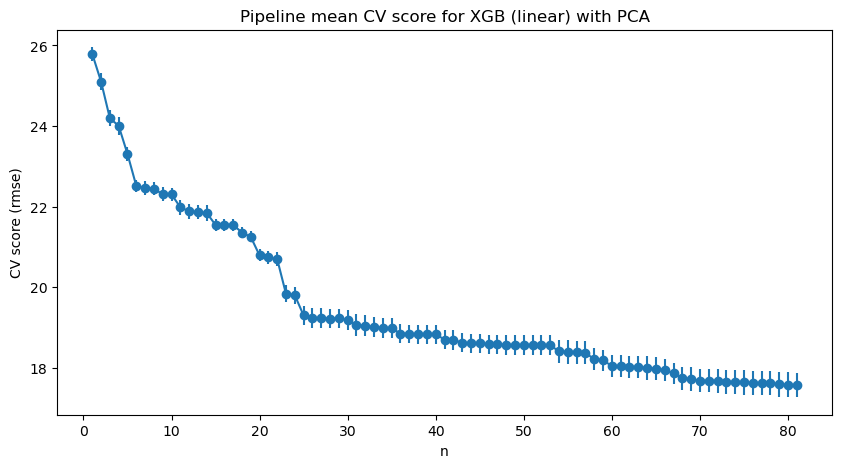

In [401]:
score_mean = -xgb_linear_pca_cv.cv_results_['mean_test_score']
score_std = xgb_linear_pca_cv.cv_results_['std_test_score']

plt.figure(figsize=(10,5))
plt.errorbar(n, score_mean, yerr=score_std, fmt='-o')
plt.ylabel('CV score (rmse)')
plt.xlabel('n')
plt.title('Pipeline mean CV score for XGB (linear) with PCA')
plt.show()

Try optimize n = 6, 16, 31, 80, 81

In [461]:
xgb_pca_linear_score = []
for i in [6, 16, 31, 80, 81]:
    pca = PCA(n_components=i)
    X_train_pca = pca.fit_transform(X_train_scaled)
    xgb_linear_eval = generate_xgb_linear_eval(X_train_pca, y_train)
    xgb_linear_opt = BayesianOptimization(xgb_linear_eval, xgb_linear_param_grid, random_state=0)
    xgb_linear_opt.maximize(n_iter=20, init_points=10)
    xgb_pca_linear_score.append((i, xgb_linear_opt.max))

|   iter    |  target   |   alpha   | n_esti... | reg_la... |
-------------------------------------------------------------
| 1         | -24.62    | 5.488     | 600.6     | 6.028     |
| 2         | -24.7     | 5.449     | 396.6     | 6.459     |
| 3         | -25.08    | 4.376     | 724.2     | 9.637     |
| 4         | -24.18    | 3.834     | 654.2     | 5.289     |
| 5         | -23.42    | 5.68      | 747.9     | 0.7104    |
| 6         | -24.32    | 0.8713    | 114.2     | 8.326     |
| 7         | -25.66    | 7.782     | 709.0     | 9.786     |
| 8         | -25.39    | 7.992     | 423.0     | 7.805     |
| 9         | -22.83    | 1.183     | 547.9     | 1.434     |
| 10        | -25.07    | 9.447     | 465.3     | 4.147     |
| 11        | -25.59    | 9.298     | 535.3     | 7.638     |
| 12        | -23.1     | 2.368     | 547.2     | 1.847     |
| 13        | -22.53    | 1.043     | 553.8     | 0.0       |
| 14        | -24.51    | 0.0       | 557.3     | 10.0      |
| 15    

| 16        | -22.23    | 0.4712    | 553.0     | 2.425     |
| 17        | -19.06    | 0.0       | 550.2     | 0.0       |
| 18        | -23.98    | 8.214     | 549.9     | 0.3121    |
| 19        | -21.18    | 0.6422    | 563.8     | 0.6569    |
| 20        | -22.88    | 4.271     | 567.0     | 0.05151   |
| 21        | -23.27    | 1.2       | 563.5     | 4.584     |
| 22        | -19.06    | 0.0       | 559.8     | 0.0       |
| 23        | -22.89    | 3.699     | 561.2     | 0.5816    |
| 24        | -20.42    | 0.6884    | 574.0     | 0.1873    |
| 25        | -19.06    | 0.0       | 578.6     | 0.0       |
| 26        | -22.84    | 4.218     | 579.0     | 0.0       |
| 27        | -22.56    | 0.1027    | 576.4     | 3.665     |
| 28        | -20.47    | 0.09402   | 584.5     | 0.4821    |
| 29        | -19.06    | 0.0       | 581.1     | 0.0       |
| 30        | -24.01    | 0.04638   | 586.8     | 8.969     |
|   iter    |  target   |   alpha   | n_esti... | reg_la... |
--------

In [462]:
xgb_pca_linear_score

[(6,
  {'target': -22.507776644354358,
   'params': {'alpha': 0.0,
    'n_estimators': 173.93624295898235,
    'reg_lambda': 0.0}}),
 (16,
  {'target': -21.663115127833766,
   'params': {'alpha': 0.21307505977119723,
    'n_estimators': 793.9089385705007,
    'reg_lambda': 0.37914515106924673}}),
 (31,
  {'target': -19.058340889595662,
   'params': {'alpha': 0.0,
    'n_estimators': 578.5500016166225,
    'reg_lambda': 0.0}}),
 (80,
  {'target': -17.587064244198814,
   'params': {'alpha': 0.0,
    'n_estimators': 547.8738783440923,
    'reg_lambda': 0.0}}),
 (81,
  {'target': -17.574756955203405,
   'params': {'alpha': 0.0,
    'n_estimators': 557.3320190726307,
    'reg_lambda': 0.0}})]

No improvement.

In [157]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Bar(x=np.arange(0, len(exp_var_ratio)), y=exp_var_ratio, name="yaxis data"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=np.arange(0, len(exp_var_ratio)), y=exp_var_ratio.cumsum(), name="yaxis2 data"),
    secondary_y=True,
)

fig.update_xaxes(range=[-0.5, 20.5])
fig.update_yaxes(range=[0.3, 1], secondary_y=True)
fig.update_yaxes(showgrid=False, secondary_y=False)
fig.update_layout(template='plotly_dark')

fig.show()

In [256]:
fig = px.bar(y=-np.diff(exp_var_ratio), range_y=[0,0.05], range_x=[0,20])
fig.show()

In [161]:
pca = PCA(n_components=80)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [162]:
ols = LinearRegression()
ols.fit(X_train_pca, y_train)
y_pred = ols.predict(X_test_pca)
mean_squared_error(y_test, y_pred, squared=False)

17.706184946450364

In [268]:
ols.coef_

array([-4.0167098 , -2.02945722, -2.41544752, -1.18752244,  2.63288017])

In [163]:
xgb_param_grid = {'n_estimators':(100,300), 'max_depth':(1,20),
                      'learning_rate':(0.01,1), 'gamma':(0.0 ,1.0), 'reg_alpha':(0.0,1.0), 'reg_lambda':(0.0,1.0),
                     'subsample':(0.01, 1.0), 'colsample_bytree':(0.01, 1.0)}
xgb_eval = generate_xgb_eval(X_train_pca, y_train)
xgb_opt = BayesianOptimization(xgb_eval, xgb_param_grid)
xgb_opt.maximize(n_iter=20, init_points=10)

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -13.18    | 0.9594    | 0.7933    | 0.5809    | 3.172     | 159.5     | 0.6736    | 0.6626    | 0.4477    |
| 2         | -16.69    | 0.8878    | 0.1974    | 0.7605    | 6.916     | 260.8     | 0.6847    | 0.497     | 0.5275    |
| 3         | -14.8     | 0.5579    | 0.156     | 0.9308    | 1.629     | 146.5     | 0.1597    | 0.6766    | 0.6494    |
| 4         | -11.57    | 0.1815    | 0.6568    | 0.1104    | 16.32     | 129.0     | 0.2999    | 0.7321    | 0.2432    |
| 5         | -15.81    | 0.806     | 0.1737    | 0.5993    | 1.293     | 142.5     | 0.5304    | 0.6838    | 0.6458    |
| 6         | -13.53    | 0.4948    | 0.3283    | 0.648     | 16.99     | 178.3     | 0.1126    | 0.8252    | 0.7736    |
| 7         | -26.79    

In [279]:
params = xgb_opt.max['params']
params['n_estimators'] = int(params['n_estimators'])
params['max_depth'] = int(params['max_depth'])
xgb_pca_reg = xgb.XGBRegressor(**params)
xgb_pca_reg.fit(X_train_pca, y_train)
y_pred = xgb_pca_reg.predict(X_test_pca)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'rmse: {rmse:.2f}, r2: {r2:.2f}')

rmse: 13.22, r2: 0.85


In [261]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test, y=y_pred, mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))
fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', line=dict(dash='dash', color='red', width=3)))
fig.add_annotation(x=70, y=0, text=f'rmse = {rmse:.2f}', showarrow=False,  font={'size':17})
fig.update_layout(template = 'simple_white', title='XGBoost',yaxis_title='y_pred',xaxis_title='y_test', showlegend=False)
fig.show()

In [280]:
importances = xgb_pca_reg.feature_importances_
fig = px.bar(x=importances, text_auto='.2')
fig.update_layout(template = 'plotly', title='Important features based on XGBoost',yaxis_title='Feature',xaxis_title='Importance')
fig.show()

In [264]:
importances

array([0.49857935, 0.06132125, 0.07711503, 0.16323996, 0.19974448],
      dtype=float32)

In [321]:
a = pd.DataFrame({'feature':X.columns}).join(pd.DataFrame(abs(pca.components_).T).add_prefix('basis_'))
a.sort_values('basis_0', ascending=False).head(20)

,feature,basis_0,basis_1,basis_2,basis_3,basis_4
17,range_fie,0.164100,0.027134,0.005093,0.047730,0.018480
20,wtd_std_fie,0.163597,0.030501,0.049889,0.071884,0.005128
27,range_atomic_radius,0.163548,0.019970,0.014712,0.003208,0.062481
26,wtd_entropy_atomic_radius,0.163481,0.066276,0.075625,0.033923,0.002438
30,wtd_std_atomic_radius,0.160526,0.044061,0.031075,0.031519,0.049511
75,entropy_Valence,0.158649,0.090371,0.071209,0.054166,0.033704
15,entropy_fie,0.156563,0.088662,0.095172,0.058284,0.019747
6,wtd_entropy_atomic_mass,0.156382,0.081645,0.049371,0.046554,0.003509
76,wtd_entropy_Valence,0.156111,0.078361,0.104710,0.048142,0.016555
0,number_of_elements,0.155765,0.091113,0.075329,0.058423,0.012792


In [308]:
group_key = ((a.index - 1) // 10) * 10
f = lambda x: (x**2).sum()
a.groupby([group_key, a['feature'].str.split('_').str[-1]]).agg(f)

C:\Users\mtdra\AppData\Local\Temp\ipykernel_23084\3020597939.py:3: FutureWarning:

Dropping invalid columns in DataFrameGroupBy.agg is deprecated. In a future version, a TypeError will be raised. Before calling .agg, select only columns which should be valid for the function.



,,basis_0,basis_1,basis_2,basis_3,basis_4
,feature,,,,,
-10,elements,0.024263,0.008302,0.005674,0.003413,0.000164
0,mass,0.125103,0.217770,0.051103,0.138275,0.029399
10,fie,0.155830,0.115683,0.111144,0.114784,0.050785
20,radius,0.175513,0.185366,0.039166,0.015526,0.040890
30,Density,0.125306,0.121397,0.123663,0.148878,0.095434
40,ElectronAffinity,0.070512,0.056318,0.125550,0.356687,0.062681
50,FusionHeat,0.089349,0.246529,0.171280,0.081709,0.251308
60,ThermalConductivity,0.090141,0.030206,0.152168,0.091092,0.397321
70,Valence,0.143982,0.018428,0.220250,0.049635,0.072017


In [757]:
f_test, _ = f_regression(X_train, y_train)
f_test /= np.max(f_test)

mi = mutual_info_regression(X_train, y_train, random_state=1)
mi /= np.max(mi)

In [755]:
f_test

array([9.76882611e+03, 2.13201405e+02, 1.82027133e+03, 9.38277977e+02,
       2.68143781e+03, 7.26707271e+03, 1.11376614e+04, 5.44270346e+03,
       2.18228016e+03, 2.86661699e+03, 2.54573587e+03, 1.80740317e+02,
       3.21260795e+03, 1.11254345e+01, 2.26564248e+03, 8.20991721e+03,
       3.05802463e+03, 9.74597623e+03, 1.69802043e+03, 7.15736755e+03,
       8.80382122e+03, 1.96651018e+02, 1.65170593e+03, 3.55660936e+02,
       3.35062071e+03, 7.84354264e+03, 9.86726455e+03, 1.27772174e+04,
       2.31261649e+03, 7.82335235e+03, 9.58899565e+03, 2.66747479e+03,
       3.93207770e+03, 7.08561123e+03, 7.01309492e+03, 4.55230161e+03,
       3.27508088e+03, 1.25955597e+03, 1.51082405e+03, 2.34906694e+02,
       7.79191198e+02, 6.73877939e+02, 2.11621869e+02, 2.94777918e+03,
       2.05768718e+02, 4.02618402e+03, 1.03461904e+03, 1.47774851e+03,
       5.95492865e+02, 1.26936944e+03, 1.88050957e+03, 3.01129450e+03,
       3.15752590e+03, 3.89923288e+03, 3.93318008e+03, 7.61762768e+03,
      

In [688]:
mi

array([0.4474326 , 0.80017526, 0.6540932 , 0.84882205, 0.70693503,
       0.98604886, 0.69284073, 0.87353262, 0.56927027, 0.82737688,
       0.64856062, 0.78662359, 0.76672545, 0.74568983, 0.69005956,
       0.86772137, 0.58811035, 0.97512191, 0.62534675, 0.99517034,
       0.8302049 , 0.72178311, 0.73535755, 0.80823345, 0.8358458 ,
       0.96631942, 0.67175081, 0.88147168, 0.51398227, 0.89947184,
       0.77729092, 0.83828922, 0.68747802, 1.        , 0.89519839,
       0.94547794, 0.52041732, 0.92723387, 0.64233813, 0.82862597,
       0.69463735, 0.85123875, 0.67207711, 0.89145593, 0.63954441,
       0.94435397, 0.48609253, 0.970309  , 0.71679007, 0.93774159,
       0.76608311, 0.86550167, 0.81870559, 0.91496888, 0.85622289,
       0.93476417, 0.619639  , 0.85259093, 0.77614779, 0.8190157 ,
       0.78525283, 0.92514151, 0.70502231, 0.88179632, 0.77080046,
       0.79155697, 0.51363325, 0.8053658 , 0.7539847 , 0.98202828,
       0.86050517, 0.65643396, 0.93827639, 0.83789777, 0.94260

In [758]:
b = pd.DataFrame({'feature':X.columns, 'f_test':f_test, 'mi':mi})
b.nsmallest(10, 'f_test')

,feature,f_test,mi
13,gmean_fie,0.000593,0.747560
65,entropy_ThermalConductivity,0.006911,0.789899
11,mean_fie,0.009628,0.783938
21,mean_atomic_radius,0.010476,0.721008
44,wtd_gmean_ElectronAffinity,0.010962,0.637851
42,wtd_mean_ElectronAffinity,0.011274,0.669373
1,mean_atomic_mass,0.011358,0.800283
39,std_Density,0.012514,0.827077
66,wtd_entropy_ThermalConductivity,0.012812,0.514147
23,gmean_atomic_radius,0.018947,0.806346


In [654]:
b.nsmallest(1, 'mi')

,feature,f_test,mi
77,range_Valence,0.019306,0.141183


In [373]:
steps = [('scaler', StandardScaler()), ('selectkbest', SelectKBest(mutual_info_regression)), ('ols', LinearRegression())]
pipeline = Pipeline(steps)
k = [k+1 for k in range(X_train.shape[1])]
parameters = {'selectkbest__k':k}

cv = GridSearchCV(pipeline, param_grid=parameters, scoring='neg_mean_squared_error')
cv.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('selectkbest',
                                        SelectKBest(score_func=<function mutual_info_regression at 0x00000246944734C0>)),
                                       ('ols', LinearRegression())]),
             param_grid={'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29,
                                            30, ...]},
             scoring='neg_mean_squared_error')

In [374]:
score_mean = cv.cv_results_['mean_test_score']
score_std = cv.cv_results_['std_test_score']

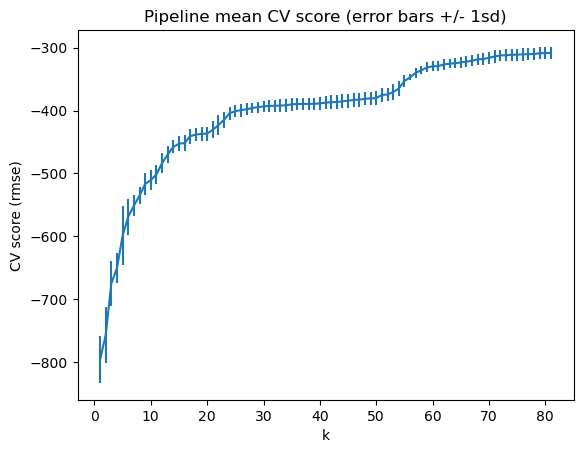

In [375]:
plt.Figure(figsize=(10, 5))
plt.errorbar(k, score_mean, yerr=score_std)
#plt.axvline(x=best_k, c='r', ls='--', alpha=.5)
plt.xlabel('k')
plt.ylabel('CV score (rmse)')
plt.title('Pipeline mean CV score (error bars +/- 1sd)')
plt.show()

In [ ]:
'selectkbest__score_func':[f_regression, mutual_info_regression], 

In [377]:
kbest = SelectKBest(score_func=f_regression, k=10)
X_new = kbest.fit_transform(X_train_scaled, y_train)
X_test_new = kbest.transform(X_test_scaled)

In [407]:
xgb_param_grid = {'n_estimators':(100,300), 'max_depth':(1,20),
                      'learning_rate':(0.01,1), 'gamma':(0.0 ,1.0), 'reg_alpha':(0.0,1.0), 'reg_lambda':(0.0,1.0),
                     'subsample':(0.01, 1.0), 'colsample_bytree':(0.01, 1.0)}
scores = []
for k in range(1,82):
    kbest = SelectKBest(score_func=f_regression, k=k)
    X_new = kbest.fit_transform(X_train, y_train)
#    X_test_new = kbest.transform(X_test_scaled)
    xgb_eval = generate_xgb_eval(X_new, y_train)
    xgb_opt = BayesianOptimization(xgb_eval, xgb_param_grid, random_state=0)
    xgb_opt.maximize(n_iter=20, init_points=10)
    scores.append(xgb_opt.max['target'])

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -21.77    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -196.1    | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -24.21    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -22.13    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -19.44    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -20.6     | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -26.59    

| 9         | -18.89    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -19.61    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -25.17    | 0.6182    | 0.8174    | 0.7124    | 11.46     | 255.2     | 0.7037    | 0.1164    | 0.3405    |
| 12        | -20.79    | 0.7682    | 0.6519    | 0.7053    | 9.747     | 241.2     | 0.8112    | 0.7084    | 0.8466    |
| 13        | -24.3     | 0.3707    | 0.518     | 0.6367    | 8.56      | 286.0     | 0.7627    | 0.3343    | 0.1627    |
| 14        | -25.96    | 0.6099    | 0.3378    | 0.7345    | 14.95     | 164.1     | 0.6407    | 0.2472    | 0.3173    |
| 15        | -20.09    | 0.5918    | 0.1317    | 0.1487    | 1.947     | 295.0     | 0.8089    | 0.6088    | 0.09632   |
| 16        | -19.5     | 0.8627    | 0.4351    | 0.4046    | 9.108     | 220.1     | 0.3928    | 0.3501    | 0.8613    |
| 17        | -18.48    

| 18        | -1.303e+0 | 1.0       | 0.0       | 1.0       | 11.36     | 159.0     | 1.0       | 1.0       | 0.01      |
| 19        | -1.13e+15 | 1.0       | 0.0       | 1.0       | 9.838     | 241.8     | 1.0       | 0.0       | 0.01      |
| 20        | -16.41    | 0.4222    | 0.3303    | 0.443     | 14.9      | 278.3     | 0.4107    | 0.6546    | 0.5058    |
| 21        | -17.07    | 0.01      | 1.0       | 1.0       | 15.0      | 116.2     | 1.0       | 0.0       | 1.0       |
| 22        | -18.25    | 0.01      | 1.0       | 1.0       | 1.0       | 224.5     | 0.0       | 0.0       | 1.0       |
| 23        | -26.88    | 1.0       | 0.0       | 0.01      | 1.0       | 106.3     | 0.0       | 1.0       | 0.01      |
| 24        | -17.06    | 0.01      | 1.0       | 1.0       | 15.0      | 100.0     | 1.0       | 0.0       | 1.0       |
| 25        | -17.94    | 0.5531    | 0.6651    | 0.9501    | 1.036     | 283.1     | 0.08084   | 0.526     | 0.324     |
| 26        | -21.6     

| 27        | -27.64    | 1.0       | 1.0       | 1.0       | 1.0       | 116.4     | 0.0       | 0.0       | 0.01      |
| 28        | -24.12    | 1.0       | 1.0       | 0.01      | 15.0      | 100.0     | 0.0       | 0.0       | 0.01      |
| 29        | -15.95    | 1.0       | 0.0       | 0.01      | 15.0      | 172.7     | 1.0       | 1.0       | 1.0       |
| 30        | -14.45    | 1.0       | 1.0       | 1.0       | 15.0      | 125.9     | 1.0       | 1.0       | 1.0       |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -12.7     | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -5.428e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -15.88    

| 4         | -14.87    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -11.97    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -17.58    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -21.32    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -15.33    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -15.34    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -17.71    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -14.75    | 0.1989    | 0.5507    | 0.6683    | 10.53     | 298.2     | 0.787     | 0.7052    | 1.0       |
| 12        | -11.64    

| 13        | -15.33    | 0.2618    | 0.4648    | 0.3582    | 14.13     | 195.9     | 0.07468   | 0.9046    | 0.7802    |
| 14        | -15.32    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -16.31    | 0.7919    | 0.4017    | 0.586     | 3.21      | 142.2     | 0.1147    | 0.5047    | 0.1388    |
| 16        | -16.71    | 0.1903    | 0.4388    | 0.8063    | 9.106     | 150.3     | 0.2162    | 0.755     | 0.6858    |
| 17        | -16.25    | 0.01      | 0.2607    | 0.7212    | 12.25     | 139.2     | 0.2387    | 1.0       | 0.8451    |
| 18        | -20.08    | 1.0       | 0.0       | 0.01      | 10.8      | 160.4     | 1.0       | 0.7603    | 0.01      |
| 19        | -14.66    | 0.7004    | 0.8018    | 0.8135    | 3.278     | 166.8     | 0.2912    | 0.01513   | 0.5302    |
| 20        | -11.48    | 0.7809    | 0.2454    | 0.1932    | 10.84     | 173.7     | 0.9119    | 0.7282    | 0.403     |
| 21        | -17.39    

| 22        | -20.57    | 1.0       | 1.0       | 0.01      | 14.33     | 129.1     | 0.0       | 0.0       | 0.01      |
| 23        | -15.68    | 0.01      | 0.0       | 1.0       | 7.366     | 121.8     | 1.0       | 1.0       | 1.0       |
| 24        | -21.76    | 1.0       | 1.0       | 0.01      | 15.0      | 116.5     | 0.0       | 0.0       | 0.01      |
| 25        | -22.75    | 1.0       | 1.0       | 0.01      | 5.832     | 111.7     | 0.0       | 0.0       | 0.01      |
| 26        | -16.1     | 0.01      | 0.0       | 1.0       | 14.32     | 106.4     | 1.0       | 1.0       | 1.0       |
| 27        | -25.35    | 1.0       | 1.0       | 0.01      | 5.566     | 101.3     | 0.0       | 1.0       | 0.01      |
| 28        | -14.44    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -20.93    | 0.6642    | 0.3166    | 0.6029    | 11.84     | 271.4     | 0.7307    | 0.6325    | 0.2751    |
| 30        | -16.03    

| 1         | -12.42    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -4.655e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -16.67    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -14.27    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -11.16    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -17.08    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -40.43    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -15.35    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -14.56    

| 10        | -17.44    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -13.85    | 0.1642    | 0.6639    | 0.3213    | 9.612     | 295.3     | 0.865     | 0.6013    | 0.9371    |
| 12        | -11.12    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -12.81    | 0.2618    | 0.4648    | 0.3582    | 14.13     | 195.9     | 0.07468   | 0.9046    | 0.7802    |
| 14        | -15.08    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -16.43    | 0.7918    | 0.4016    | 0.5858    | 3.21      | 142.2     | 0.1146    | 0.5044    | 0.1387    |
| 16        | -15.42    | 0.1906    | 0.4388    | 0.8061    | 9.106     | 150.3     | 0.217     | 0.7548    | 0.6857    |
| 17        | -15.24    | 0.01      | 0.2616    | 0.7222    | 12.25     | 139.2     | 0.2399    | 1.0       | 0.8459    |
| 18        | -18.44    

| 19        | -14.03    | 0.7004    | 0.8018    | 0.8135    | 3.278     | 166.8     | 0.2912    | 0.01513   | 0.5302    |
| 20        | -11.08    | 0.781     | 0.2462    | 0.1938    | 10.83     | 173.7     | 0.9108    | 0.8678    | 0.4029    |
| 21        | -17.07    | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -5.952e+1 | 1.0       | 1.0       | 1.0       | 14.32     | 129.1     | 0.0       | 0.0       | 0.01      |
| 23        | -6.217e+1 | 0.5185    | 0.0       | 1.0       | 7.472     | 280.1     | 0.0       | 0.0       | 0.01      |
| 24        | -16.88    | 0.08196   | 0.7058    | 0.6662    | 1.102     | 255.1     | 0.7235    | 0.6284    | 0.7228    |
| 25        | -25.1     | 0.01      | 0.0       | 0.01      | 5.349     | 108.7     | 1.0       | 1.0       | 1.0       |
| 26        | -13.29    | 0.4246    | 0.6748    | 0.8619    | 14.94     | 246.9     | 0.1173    | 0.3281    | 0.9837    |
| 27        | -2.176e+1 

| 28        | -13.84    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -17.49    | 0.1661    | 1.0       | 1.0       | 11.78     | 271.5     | 0.0       | 0.2578    | 0.9763    |
| 30        | -15.87    | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.98    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -6.197e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -16.79    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -13.78    

| 5         | -10.48    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -16.51    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -44.74    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.89    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -14.01    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -16.82    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -14.79    | 0.3287    | 0.6194    | 0.6471    | 9.625     | 295.2     | 0.7336    | 0.6644    | 0.5166    |
| 12        | -10.64    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -11.96    

| 14        | -13.07    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.98    | 0.7882    | 0.3976    | 0.5827    | 3.241     | 142.0     | 0.1144    | 0.5084    | 0.1388    |
| 16        | -14.34    | 0.2186    | 0.4613    | 0.7837    | 8.792     | 150.1     | 0.1937    | 0.7311    | 0.661     |
| 17        | -17.18    | 0.01      | 0.2886    | 0.7006    | 12.21     | 139.1     | 0.214     | 1.0       | 0.8442    |
| 18        | -18.37    | 1.0       | 1.0       | 0.01      | 10.85     | 160.0     | 1.0       | 0.0       | 0.01      |
| 19        | -12.42    | 0.4389    | 0.3024    | 0.635     | 3.219     | 166.6     | 0.0757    | 0.7922    | 0.8404    |
| 20        | -11.87    | 0.8131    | 0.9158    | 0.2779    | 10.35     | 173.8     | 0.9069    | 0.1293    | 0.3692    |
| 21        | -16.16    | 0.7576    | 0.225     | 0.6508    | 1.447     | 177.5     | 0.1691    | 0.7265    | 0.7987    |
| 22        | -20.46    

| 23        | -15.12    | 0.01      | 1.0       | 1.0       | 7.359     | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.66    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -22.51    | 1.0       | 0.0       | 0.01      | 5.842     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -17.05    | 0.01      | 1.0       | 1.0       | 14.34     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -23.6     | 1.0       | 1.0       | 0.01      | 5.505     | 101.3     | 0.0       | 0.0       | 0.01      |
| 28        | -13.61    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -8.096e+1 | 1.0       | 0.0       | 1.0       | 10.95     | 285.3     | 0.0       | 0.0       | 0.01      |
| 30        | -16.79    | 0.4683    | 0.3188    | 0.3156    | 1.363     | 204.5     | 0.7418    | 0.9712    | 0.9976    |
|   iter    |  target   

| 1         | -11.77    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -1.491e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -19.38    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -11.76    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -10.26    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -15.97    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -56.77    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.74    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.74    

| 10        | -16.76    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -14.6     | 0.22      | 0.6116    | 0.6047    | 9.641     | 295.1     | 0.4552    | 0.5557    | 0.5046    |
| 12        | -10.47    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -11.33    | 0.2618    | 0.4648    | 0.3582    | 14.13     | 195.9     | 0.07468   | 0.9046    | 0.7802    |
| 14        | -12.94    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -16.11    | 0.792     | 0.4017    | 0.5858    | 3.21      | 142.2     | 0.1146    | 0.5046    | 0.1389    |
| 16        | -14.45    | 0.1906    | 0.4388    | 0.8061    | 9.106     | 150.3     | 0.2168    | 0.7549    | 0.6857    |
| 17        | -16.1     | 0.01      | 0.2597    | 0.7217    | 12.25     | 139.2     | 0.239     | 1.0       | 0.8434    |
| 18        | -18.16    

| 19        | -13.81    | 0.7004    | 0.8018    | 0.8135    | 3.278     | 166.8     | 0.2912    | 0.01513   | 0.5302    |
| 20        | -10.7     | 0.7815    | 0.2453    | 0.1926    | 10.88     | 173.7     | 0.3254    | 0.2832    | 0.4028    |
| 21        | -15.87    | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -20.47    | 1.0       | 0.05908   | 0.01      | 14.32     | 129.1     | 1.0       | 0.0       | 0.01      |
| 23        | -15.17    | 0.01      | 1.0       | 1.0       | 7.359     | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.69    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -22.52    | 1.0       | 0.0       | 0.01      | 5.842     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -18.1     | 0.01      | 1.0       | 1.0       | 14.34     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -23.6     

| 28        | -13.14    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -28.68    | 0.7348    | 0.08269   | 0.3937    | 11.84     | 271.4     | 0.04263   | 0.9409    | 0.08757   |
| 30        | -14.97    | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.64    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -8.728e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -17.76    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.96    

| 5         | -10.01    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -15.2     | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -38.78    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.04    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.44    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -15.77    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -12.19    | 0.0915    | 0.779     | 0.4107    | 9.62      | 295.2     | 0.6223    | 0.6485    | 0.576     |
| 12        | -10.31    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.96    

| 14        | -12.36    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.49    | 0.7917    | 0.4017    | 0.5857    | 3.21      | 142.2     | 0.1145    | 0.5044    | 0.1386    |
| 16        | -13.55    | 0.1905    | 0.4388    | 0.8062    | 9.106     | 150.3     | 0.2167    | 0.7549    | 0.6857    |
| 17        | -15.81    | 0.01      | 0.2604    | 0.7214    | 12.25     | 139.2     | 0.2395    | 1.0       | 0.8459    |
| 18        | -18.11    | 1.0       | 0.0       | 0.01      | 10.85     | 160.3     | 0.0       | 0.0       | 0.01      |
| 19        | -14.12    | 0.01      | 1.0       | 1.0       | 3.217     | 166.7     | 1.0       | 1.0       | 1.0       |
| 20        | -10.79    | 0.9303    | 0.2272    | 0.1787    | 10.61     | 173.6     | 0.1731    | 0.05951   | 0.3103    |
| 21        | -15.22    | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -20.26    

| 23        | -15.2     | 0.01      | 1.0       | 1.0       | 7.365     | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.44    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -22.3     | 1.0       | 0.0       | 0.01      | 5.833     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -16.97    | 0.01      | 1.0       | 1.0       | 14.32     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -13.41    | 1.0       | 1.0       | 1.0       | 5.305     | 101.4     | 0.0       | 0.0       | 1.0       |
| 28        | -13.08    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -10.31    | 0.294     | 0.4931    | 0.1783    | 12.06     | 271.2     | 0.601     | 0.08435   | 0.8412    |
| 30        | -14.5     | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   

| 1         | -11.37    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -8.604e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -15.96    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.57    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.834    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -14.98    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -37.34    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.04    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.12    

| 10        | -15.53    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -11.76    | 0.1228    | 0.8419    | 0.3661    | 9.657     | 295.3     | 0.4962    | 0.9861    | 0.5275    |
| 12        | -10.17    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.91    | 0.2618    | 0.4648    | 0.3582    | 14.13     | 195.9     | 0.07468   | 0.9046    | 0.7802    |
| 14        | -12.3     | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.6     | 0.7916    | 0.4015    | 0.5855    | 3.21      | 142.2     | 0.1143    | 0.5043    | 0.1386    |
| 16        | -13.71    | 0.1904    | 0.4388    | 0.8062    | 9.106     | 150.3     | 0.2165    | 0.7549    | 0.6857    |
| 17        | -14.47    | 0.01      | 0.2611    | 0.7218    | 12.25     | 139.2     | 0.2392    | 1.0       | 0.8452    |
| 18        | -17.89    

| 19        | -11.5     | 0.4389    | 0.3024    | 0.635     | 3.219     | 166.6     | 0.0757    | 0.7922    | 0.8404    |
| 20        | -11.16    | 0.8407    | 0.7478    | 0.2525    | 10.71     | 173.6     | 0.9473    | 0.09517   | 0.3349    |
| 21        | -15.1     | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -20.21    | 1.0       | 0.06204   | 0.01      | 14.32     | 129.1     | 1.0       | 0.0       | 0.01      |
| 23        | -15.49    | 0.01      | 1.0       | 1.0       | 7.357     | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.48    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -22.29    | 1.0       | 0.0       | 0.01      | 5.839     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -16.81    | 0.01      | 1.0       | 1.0       | 14.34     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -7.709e+0 

| 28        | -12.89    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -10.1     | 0.294     | 0.4931    | 0.1783    | 12.06     | 271.2     | 0.601     | 0.08435   | 0.8412    |
| 30        | -14.51    | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.44    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -7.224e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -17.0     | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.38    

| 5         | -9.793    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -14.94    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -35.91    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.25    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.08    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -15.34    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -1.751e+0 | 0.4535    | 0.5587    | 0.6951    | 9.728     | 295.1     | 0.35      | 0.2548    | 0.1082    |
| 12        | -13.21    | 0.1028    | 0.6847    | 0.01      | 9.74      | 229.6     | 0.4082    | 1.0       | 1.0       |
| 13        | -10.88    

| 14        | -12.05    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.93    | 0.7916    | 0.4015    | 0.5856    | 3.21      | 142.2     | 0.1144    | 0.5043    | 0.1387    |
| 16        | -13.69    | 0.1906    | 0.4388    | 0.8061    | 9.106     | 150.3     | 0.2169    | 0.7548    | 0.6857    |
| 17        | -14.58    | 0.01      | 0.2611    | 0.7226    | 12.25     | 139.2     | 0.2413    | 1.0       | 0.8445    |
| 18        | -19.4     | 1.0       | 0.0       | 0.01      | 10.8      | 160.4     | 1.0       | 0.7083    | 0.01      |
| 19        | -13.34    | 0.7004    | 0.8018    | 0.8135    | 3.278     | 166.8     | 0.2912    | 0.01513   | 0.5302    |
| 20        | -10.19    | 0.7811    | 0.2456    | 0.1935    | 10.85     | 173.7     | 0.9114    | 0.6979    | 0.4028    |
| 21        | -15.07    | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -20.24    

| 23        | -14.74    | 0.01      | 1.0       | 1.0       | 7.355     | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.52    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -22.32    | 1.0       | 0.0       | 0.01      | 5.864     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -15.4     | 0.01      | 1.0       | 1.0       | 14.37     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -13.22    | 1.0       | 1.0       | 1.0       | 5.386     | 101.4     | 0.0       | 0.0       | 1.0       |
| 28        | -13.19    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -10.19    | 0.294     | 0.4931    | 0.1783    | 12.06     | 271.2     | 0.601     | 0.08435   | 0.8412    |
| 30        | -14.98    | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   

| 1         | -11.49    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -1.074e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -15.37    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.24    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.74     | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -15.09    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -41.97    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.48    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.18    

| 10        | -15.37    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -12.35    | 0.02624   | 0.602     | 0.1629    | 9.657     | 295.2     | 0.5358    | 0.6218    | 0.6379    |
| 12        | -10.08    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.86    | 0.2618    | 0.4648    | 0.3582    | 14.13     | 195.9     | 0.07468   | 0.9046    | 0.7802    |
| 14        | -12.0     | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.76    | 0.7916    | 0.4015    | 0.5855    | 3.21      | 142.2     | 0.1142    | 0.5046    | 0.1386    |
| 16        | -13.69    | 0.1906    | 0.4389    | 0.8062    | 9.106     | 150.3     | 0.2167    | 0.7549    | 0.6857    |
| 17        | -17.2     | 0.01      | 0.2608    | 0.7223    | 12.25     | 139.2     | 0.2396    | 1.0       | 0.8461    |
| 18        | -19.41    

| 19        | -13.24    | 0.7004    | 0.8018    | 0.8135    | 3.278     | 166.8     | 0.2912    | 0.01513   | 0.5302    |
| 20        | -10.38    | 0.7806    | 0.2453    | 0.1935    | 10.88     | 173.7     | 0.326     | 0.2825    | 0.4023    |
| 21        | -14.99    | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -20.17    | 1.0       | 0.06331   | 0.01      | 14.32     | 129.1     | 1.0       | 0.0       | 0.01      |
| 23        | -16.67    | 0.01      | 1.0       | 1.0       | 7.358     | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.42    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -22.24    | 1.0       | 0.0       | 0.01      | 5.842     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -20.17    | 0.01      | 1.0       | 1.0       | 14.34     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -22.73    

| 28        | -16.73    | 0.01      | 1.0       | 0.01      | 8.016     | 241.4     | 1.0       | 1.0       | 1.0       |
| 29        | -13.53    | 0.2367    | 0.6064    | 0.7911    | 4.499     | 257.5     | 0.5919    | 0.3959    | 0.5677    |
| 30        | -14.04    | 0.8935    | 0.2523    | 0.7801    | 1.13      | 247.6     | 0.1483    | 0.699     | 0.5226    |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.33    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -7.293e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -18.94    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.28    

| 5         | -9.736    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -15.2     | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -42.41    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.18    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.04    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -15.45    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -10.89    | 0.05724   | 0.8041    | 0.1962    | 9.646     | 295.3     | 0.5753    | 0.7424    | 0.6017    |
| 12        | -10.04    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.86    

| 14        | -11.87    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.36    | 0.7884    | 0.3978    | 0.5827    | 3.241     | 142.0     | 0.1146    | 0.5083    | 0.1388    |
| 16        | -12.98    | 0.2186    | 0.4613    | 0.7837    | 8.792     | 150.1     | 0.1937    | 0.7311    | 0.661     |
| 17        | -14.39    | 0.01      | 0.2899    | 0.7016    | 12.21     | 139.1     | 0.214     | 1.0       | 0.8444    |
| 18        | -17.84    | 1.0       | 0.0       | 0.01      | 10.83     | 160.0     | 1.0       | 0.0       | 0.01      |
| 19        | -11.68    | 0.4389    | 0.3024    | 0.635     | 3.219     | 166.6     | 0.0757    | 0.7922    | 0.8404    |
| 20        | -11.34    | 0.8149    | 0.3902    | 0.2755    | 10.37     | 173.8     | 0.9098    | 0.1268    | 0.3675    |
| 21        | -14.43    | 0.7576    | 0.225     | 0.6508    | 1.447     | 177.5     | 0.1691    | 0.7265    | 0.7987    |
| 22        | -100.5    

| 23        | -14.43    | 0.01      | 1.0       | 1.0       | 7.36      | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.25    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -22.03    | 1.0       | 0.0       | 0.01      | 5.847     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -14.69    | 0.01      | 1.0       | 1.0       | 14.34     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -12.76    | 1.0       | 1.0       | 1.0       | 5.343     | 101.4     | 0.0       | 0.0       | 1.0       |
| 28        | -13.08    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -9.943    | 0.6087    | 0.09434   | 0.04515   | 11.81     | 271.4     | 0.5562    | 0.4298    | 0.1525    |
| 30        | -14.94    | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   

| 1         | -11.09    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -2.147e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -19.2     | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.21    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.652    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -14.9     | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -41.31    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.12    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -12.91    

| 10        | -15.26    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -13.04    | 0.03717   | 0.5205    | 0.1568    | 9.714     | 295.3     | 0.6387    | 0.8132    | 0.1687    |
| 12        | -10.03    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.85    | 0.2618    | 0.4648    | 0.3582    | 14.13     | 195.9     | 0.07468   | 0.9046    | 0.7802    |
| 14        | -11.76    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.45    | 0.7917    | 0.4016    | 0.5857    | 3.21      | 142.2     | 0.1145    | 0.5045    | 0.1388    |
| 16        | -13.46    | 0.1905    | 0.4388    | 0.8062    | 9.106     | 150.3     | 0.2165    | 0.7549    | 0.6857    |
| 17        | -16.64    | 0.01      | 0.261     | 0.7219    | 12.25     | 139.2     | 0.239     | 1.0       | 0.845     |
| 18        | -19.17    

| 19        | -13.29    | 0.7004    | 0.8018    | 0.8135    | 3.278     | 166.8     | 0.2912    | 0.01513   | 0.5302    |
| 20        | -10.39    | 0.7814    | 0.2452    | 0.1929    | 10.88     | 173.7     | 0.3253    | 0.2828    | 0.4026    |
| 21        | -14.73    | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -19.86    | 1.0       | 1.0       | 0.01      | 14.33     | 129.1     | 0.0       | 0.0       | 0.01      |
| 23        | -17.13    | 0.01      | 0.0       | 1.0       | 7.366     | 121.8     | 1.0       | 1.0       | 1.0       |
| 24        | -21.11    | 1.0       | 1.0       | 0.01      | 15.0      | 116.5     | 0.0       | 0.0       | 0.01      |
| 25        | -21.9     | 1.0       | 1.0       | 0.01      | 5.833     | 111.7     | 0.0       | 0.0       | 0.01      |
| 26        | -21.99    | 0.01      | 0.0       | 1.0       | 14.32     | 106.4     | 1.0       | 1.0       | 1.0       |
| 27        | -12.96    

| 28        | -12.81    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -10.02    | 0.5998    | 0.1892    | 0.09806   | 11.81     | 271.3     | 0.7224    | 0.3779    | 0.1924    |
| 30        | -14.71    | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.23    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -1.401e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -19.91    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.26    

| 5         | -9.638    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -14.7     | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -41.44    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.2     | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.04    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -15.3     | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -11.67    | 0.06751   | 0.8562    | 0.3814    | 9.63      | 295.2     | 0.5522    | 0.721     | 0.5434    |
| 12        | -9.955    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.62    

| 14        | -11.67    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.65    | 0.7913    | 0.4012    | 0.5854    | 3.213     | 142.2     | 0.1144    | 0.5047    | 0.1386    |
| 16        | -13.56    | 0.1926    | 0.4405    | 0.8044    | 9.078     | 150.3     | 0.2166    | 0.7529    | 0.6837    |
| 17        | -14.8     | 0.01      | 0.2624    | 0.7197    | 12.25     | 139.2     | 0.2395    | 1.0       | 0.8449    |
| 18        | -17.69    | 1.0       | 0.0       | 0.01      | 10.85     | 160.3     | 0.0       | 0.0       | 0.01      |
| 19        | -13.27    | 0.7004    | 0.8018    | 0.8135    | 3.278     | 166.8     | 0.2912    | 0.01513   | 0.5302    |
| 20        | -10.28    | 0.7771    | 0.2507    | 0.1918    | 10.86     | 173.7     | 0.3285    | 0.2769    | 0.4066    |
| 21        | -14.8     | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -20.03    

| 23        | -2.86e+14 | 0.7659    | 1.0       | 1.0       | 6.803     | 280.5     | 0.0       | 1.0       | 0.01      |
| 24        | -15.01    | 0.279     | 0.3629    | 0.2412    | 1.25      | 256.2     | 0.8911    | 0.9657    | 0.7021    |
| 25        | -18.73    | 0.01      | 0.0       | 1.0       | 15.0      | 246.4     | 0.0       | 1.0       | 1.0       |
| 26        | -29.9     | 0.01      | 0.0       | 0.01      | 1.0       | 100.0     | 1.0       | 1.0       | 1.0       |
| 27        | -20.2     | 1.0       | 0.0       | 0.01      | 15.0      | 100.0     | 1.0       | 0.0       | 1.0       |
| 28        | -15.0     | 0.01      | 1.0       | 0.01      | 15.0      | 259.2     | 0.0       | 0.0       | 1.0       |
| 29        | -15.28    | 0.3925    | 0.9969    | 0.9146    | 1.0       | 113.7     | 0.4583    | 0.9112    | 0.2387    |
| 30        | -15.44    | 0.01      | 0.0       | 1.0       | 1.0       | 205.1     | 1.0       | 1.0       | 1.0       |
|   iter    |  target   

| 1         | -11.18    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -1.377e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -19.9     | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.22    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.664    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -14.8     | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -37.5     | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.24    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.06    

| 10        | -15.19    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -11.53    | 0.0415    | 0.6368    | 0.3147    | 9.614     | 295.2     | 0.7876    | 0.5319    | 0.7781    |
| 12        | -9.951    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.73    | 0.2618    | 0.4648    | 0.3582    | 14.13     | 195.9     | 0.07468   | 0.9046    | 0.7802    |
| 14        | -11.59    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -16.18    | 0.7918    | 0.4016    | 0.5856    | 3.21      | 142.2     | 0.1144    | 0.5045    | 0.1387    |
| 16        | -13.4     | 0.1906    | 0.4388    | 0.8061    | 9.106     | 150.3     | 0.217     | 0.7548    | 0.6857    |
| 17        | -16.65    | 0.01      | 0.2601    | 0.7204    | 12.25     | 139.2     | 0.2392    | 1.0       | 0.8448    |
| 18        | -17.62    

| 19        | -13.18    | 0.7004    | 0.8018    | 0.8135    | 3.278     | 166.8     | 0.2912    | 0.01513   | 0.5302    |
| 20        | -10.24    | 0.7812    | 0.2446    | 0.1924    | 10.88     | 173.7     | 0.3251    | 0.2833    | 0.4022    |
| 21        | -14.8     | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -19.85    | 1.0       | 0.06012   | 0.01      | 14.32     | 129.1     | 1.0       | 0.0       | 0.01      |
| 23        | -17.69    | 0.01      | 1.0       | 1.0       | 7.358     | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.13    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -21.89    | 1.0       | 0.0       | 0.01      | 5.842     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -20.77    | 0.01      | 1.0       | 1.0       | 14.34     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -16.55    

| 28        | -26.89    | 0.01      | 0.0       | 0.01      | 15.0      | 115.5     | 1.0       | 1.0       | 0.01      |
| 29        | -15.37    | 1.0       | 0.0       | 0.01      | 15.0      | 259.7     | 0.0       | 1.0       | 0.01      |
| 30        | -25.23    | 1.0       | 1.0       | 0.01      | 1.0       | 119.6     | 1.0       | 1.0       | 1.0       |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.18    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -6.588e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -20.57    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.17    

| 5         | -9.614    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -15.12    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -38.7     | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.2     | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.07    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -15.49    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -11.21    | 0.04735   | 0.7182    | 0.2824    | 9.613     | 295.3     | 0.853     | 0.6057    | 0.7566    |
| 12        | -9.948    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.7     

| 14        | -11.62    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.67    | 0.7918    | 0.4015    | 0.5856    | 3.21      | 142.2     | 0.1146    | 0.5044    | 0.1388    |
| 16        | -13.79    | 0.1906    | 0.4388    | 0.8061    | 9.106     | 150.3     | 0.217     | 0.7548    | 0.6857    |
| 17        | -17.49    | 0.01      | 0.261     | 0.7219    | 12.25     | 139.2     | 0.2405    | 1.0       | 0.8448    |
| 18        | -17.61    | 1.0       | 0.0       | 0.01      | 10.82     | 160.3     | 1.0       | 0.0       | 0.01      |
| 19        | -14.9     | 0.01      | 1.0       | 1.0       | 3.236     | 166.7     | 0.0       | 1.0       | 1.0       |
| 20        | -10.48    | 0.9331    | 0.2222    | 0.1732    | 10.63     | 173.6     | 0.9572    | 0.05456   | 0.305     |
| 21        | -14.78    | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -9.95e+13 

| 23        | -14.36    | 0.5146    | 0.06255   | 0.4524    | 1.02      | 253.3     | 0.7341    | 0.3358    | 0.9715    |
| 24        | -12.38    | 0.4207    | 0.9597    | 0.3105    | 14.95     | 284.6     | 0.2419    | 0.6257    | 0.3012    |
| 25        | -14.4     | 0.861     | 0.9363    | 0.6021    | 1.023     | 149.3     | 0.006183  | 0.141     | 0.2637    |
| 26        | -12.5     | 1.0       | 1.0       | 1.0       | 15.0      | 125.4     | 1.0       | 0.0       | 1.0       |
| 27        | -25.6     | 0.01      | 1.0       | 0.01      | 4.442     | 119.1     | 0.0       | 0.0       | 1.0       |
| 28        | -9.878e+0 | 1.0       | 0.0       | 1.0       | 15.0      | 113.1     | 0.0       | 1.0       | 0.01      |
| 29        | -13.74    | 0.9889    | 0.7739    | 0.9865    | 1.17      | 204.4     | 0.9858    | 0.6693    | 0.7389    |
| 30        | -13.86    | 0.3778    | 0.1025    | 0.6137    | 1.112     | 288.5     | 0.3999    | 0.7228    | 0.4929    |
|   iter    |  target   

| 1         | -11.24    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -8.506e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -16.7     | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.05    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.617    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -15.0     | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -41.4     | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.4     | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -12.98    

| 10        | -15.06    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -13.61    | 0.02258   | 0.8909    | 0.4482    | 9.618     | 295.3     | 0.6655    | 0.8558    | 0.6076    |
| 12        | -9.947    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.62    | 0.2618    | 0.4648    | 0.3582    | 14.13     | 195.9     | 0.07468   | 0.9046    | 0.7802    |
| 14        | -11.59    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.5     | 0.7917    | 0.4015    | 0.5856    | 3.21      | 142.2     | 0.1146    | 0.5043    | 0.1387    |
| 16        | -13.23    | 0.1906    | 0.4389    | 0.8062    | 9.106     | 150.3     | 0.2167    | 0.7548    | 0.6856    |
| 17        | -15.33    | 0.01      | 0.2605    | 0.722     | 12.25     | 139.2     | 0.2388    | 1.0       | 0.8441    |
| 18        | -17.57    

| 19        | -14.5     | 1.0       | 0.0       | 0.01      | 9.838     | 260.7     | 0.0       | 0.0       | 0.01      |
| 20        | -14.14    | 0.6068    | 0.2824    | 0.3888    | 1.088     | 256.0     | 0.4797    | 0.3762    | 0.8652    |
| 21        | -3.586e+0 | 0.3468    | 0.3287    | 0.5722    | 9.359     | 250.1     | 0.1596    | 0.4644    | 0.01      |
| 22        | -16.66    | 0.0885    | 0.8454    | 0.09437   | 1.004     | 185.6     | 0.7191    | 0.8262    | 0.1197    |
| 23        | -18.06    | 1.0       | 0.0       | 0.01      | 3.858     | 176.4     | 0.0       | 0.0       | 0.01      |
| 24        | -13.76    | 0.8958    | 0.4477    | 0.4722    | 2.672     | 166.3     | 0.1597    | 0.2528    | 0.1431    |
| 25        | -15.18    | 0.01      | 1.0       | 1.0       | 11.39     | 170.9     | 1.0       | 1.0       | 1.0       |
| 26        | -13.26    | 0.1925    | 1.0       | 1.0       | 10.42     | 160.8     | 0.8523    | 0.93      | 0.91      |
| 27        | -18.23    

| 28        | -17.16    | 0.01      | 1.0       | 0.01      | 8.03      | 241.4     | 1.0       | 1.0       | 1.0       |
| 29        | -13.42    | 0.2367    | 0.6064    | 0.7911    | 4.499     | 257.5     | 0.5919    | 0.3959    | 0.5677    |
| 30        | -13.61    | 0.8935    | 0.2523    | 0.7801    | 1.13      | 247.6     | 0.1483    | 0.699     | 0.5226    |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.27    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -1.112e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -17.03    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -9.955    

| 5         | -9.569    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -14.95    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -36.25    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.34    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.11    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -15.21    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -12.13    | 0.03672   | 0.8891    | 0.3307    | 9.646     | 295.2     | 0.3749    | 0.5135    | 0.5695    |
| 12        | -9.846    | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.57    

| 14        | -11.49    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.38    | 0.7917    | 0.4015    | 0.5857    | 3.21      | 142.2     | 0.1145    | 0.5044    | 0.1387    |
| 16        | -9.829    | 0.2863    | 0.01678   | 0.03526   | 9.048     | 150.3     | 0.5709    | 0.972     | 0.5536    |
| 17        | -21.08    | 0.01      | 0.0       | 0.01      | 12.22     | 139.2     | 0.6934    | 1.0       | 0.6802    |
| 18        | -2.665e+1 | 1.0       | 1.0       | 1.0       | 10.92     | 160.3     | 0.0       | 0.0       | 0.01      |
| 19        | -15.7     | 0.7555    | 0.7726    | 0.132     | 1.042     | 204.2     | 0.07257   | 0.8689    | 0.6196    |
| 20        | -17.75    | 0.1907    | 0.5396    | 1.0       | 6.094     | 280.1     | 0.0       | 0.7861    | 0.5237    |
| 21        | -10.12    | 0.5905    | 0.5197    | 0.01      | 14.17     | 270.9     | 1.0       | 0.3935    | 0.8087    |
| 22        | -1.194e+1 

| 23        | -15.28    | 0.01      | 1.0       | 1.0       | 7.338     | 121.9     | 0.0       | 1.0       | 1.0       |
| 24        | -21.24    | 1.0       | 0.0       | 0.01      | 15.0      | 116.8     | 1.0       | 0.0       | 0.01      |
| 25        | -21.84    | 1.0       | 0.0       | 0.01      | 6.008     | 111.8     | 1.0       | 0.0       | 0.01      |
| 26        | -15.98    | 0.01      | 1.0       | 1.0       | 14.56     | 106.7     | 0.0       | 1.0       | 1.0       |
| 27        | -15.83    | 0.01      | 1.0       | 1.0       | 5.631     | 101.7     | 0.0       | 0.0       | 1.0       |
| 28        | -12.87    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -9.883    | 0.5939    | 0.1252    | 0.03978   | 11.74     | 271.4     | 0.7965    | 0.8291    | 0.1377    |
| 30        | -15.07    | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   

| 1         | -11.25    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -1.016e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -17.61    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.08    | 0.1271    | 0.6399    | 0.1519    | 14.23     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.583    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -14.71    | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -38.81    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -13.94    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -12.78    

| 10        | -14.93    | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -11.1     | 0.08739   | 0.4087    | 0.2511    | 9.69      | 295.2     | 0.5386    | 0.08091   | 0.5342    |
| 12        | -9.95     | 0.6831    | 0.5819    | 0.04261   | 9.814     | 229.5     | 0.2426    | 0.6286    | 0.2073    |
| 13        | -10.69    | 0.2618    | 0.4648    | 0.3582    | 14.13     | 195.9     | 0.07468   | 0.9046    | 0.7802    |
| 14        | -11.61    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.62    | 0.7916    | 0.4016    | 0.5857    | 3.21      | 142.2     | 0.1145    | 0.5046    | 0.1387    |
| 16        | -13.55    | 0.1905    | 0.4388    | 0.8062    | 9.106     | 150.3     | 0.2168    | 0.7549    | 0.6857    |
| 17        | -14.76    | 0.01      | 0.2609    | 0.7217    | 12.25     | 139.2     | 0.2392    | 1.0       | 0.8445    |
| 18        | -17.5     

| 19        | -13.11    | 0.7004    | 0.8018    | 0.8135    | 3.278     | 166.8     | 0.2912    | 0.01513   | 0.5302    |
| 20        | -10.32    | 0.7806    | 0.2447    | 0.1912    | 10.88     | 173.7     | 0.3247    | 0.2825    | 0.4026    |
| 21        | -14.62    | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -19.9     | 1.0       | 0.05745   | 0.01      | 14.32     | 129.1     | 1.0       | 0.0       | 0.01      |
| 23        | -17.27    | 0.01      | 1.0       | 1.0       | 7.359     | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.16    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -21.91    | 1.0       | 0.0       | 0.01      | 5.841     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -21.32    | 0.01      | 1.0       | 1.0       | 14.34     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -7.573e+0 

| 28        | -12.97    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -9.956    | 0.597     | 0.126     | 0.08689   | 11.83     | 271.3     | 0.6458    | 0.7683    | 0.1492    |
| 30        | -14.54    | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.16    | 0.5533    | 0.7152    | 0.6067    | 8.628     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -7.455e+0 | 0.964     | 0.3834    | 0.7938    | 8.405     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -17.38    | 0.03002   | 0.8326    | 0.7804    | 13.18     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.05    

| 5         | -9.559    | 0.4616    | 0.5684    | 0.0286    | 9.647     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -15.0     | 0.3659    | 0.437     | 0.7007    | 1.843     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -35.22    | 0.3223    | 0.3637    | 0.5745    | 7.14      | 297.7     | 0.102     | 0.2089    | 0.1697    |
| 8         | -14.18    | 0.6566    | 0.2533    | 0.4716    | 4.422     | 131.8     | 0.1104    | 0.6563    | 0.1468    |
| 9         | -13.08    | 0.2046    | 0.3687    | 0.8228    | 2.359     | 267.6     | 0.0961    | 0.9765    | 0.474     |
| 10        | -14.9     | 0.977     | 0.6048    | 0.7419    | 1.549     | 156.6     | 0.1202    | 0.2961    | 0.1275    |
| 11        | -12.18    | 0.07332   | 0.413     | 0.286     | 9.743     | 295.2     | 0.21      | 0.04993   | 0.379     |
| 12        | -12.2     | 0.09322   | 0.6897    | 0.01      | 9.868     | 229.7     | 0.4004    | 1.0       | 1.0       |
| 13        | -10.56    

| 14        | -11.48    | 0.1309    | 0.1955    | 0.1094    | 4.806     | 193.7     | 0.7947    | 0.1672    | 0.2228    |
| 15        | -15.73    | 0.7915    | 0.4014    | 0.5854    | 3.21      | 142.2     | 0.1142    | 0.5046    | 0.1386    |
| 16        | -13.45    | 0.1906    | 0.4388    | 0.8061    | 9.105     | 150.3     | 0.2169    | 0.7548    | 0.6857    |
| 17        | -16.65    | 0.01      | 0.2616    | 0.7209    | 12.25     | 139.2     | 0.2427    | 1.0       | 0.8456    |
| 18        | -17.49    | 1.0       | 0.0       | 0.01      | 10.85     | 160.3     | 0.0       | 0.0       | 0.01      |
| 19        | -14.48    | 0.01      | 1.0       | 1.0       | 3.218     | 166.7     | 1.0       | 1.0       | 1.0       |
| 20        | -10.64    | 0.9304    | 0.2266    | 0.1784    | 10.61     | 173.6     | 0.1708    | 0.05867   | 0.3091    |
| 21        | -14.6     | 0.1509    | 0.5533    | 0.9837    | 1.412     | 177.2     | 0.9186    | 0.06095   | 0.423     |
| 22        | -19.72    

| 23        | -16.38    | 0.01      | 1.0       | 1.0       | 7.359     | 121.8     | 0.0       | 1.0       | 1.0       |
| 24        | -21.13    | 1.0       | 0.0       | 0.01      | 15.0      | 116.5     | 1.0       | 0.0       | 0.01      |
| 25        | -21.88    | 1.0       | 0.0       | 0.01      | 5.842     | 111.7     | 1.0       | 0.0       | 0.01      |
| 26        | -19.79    | 0.01      | 1.0       | 1.0       | 14.34     | 106.4     | 0.0       | 1.0       | 1.0       |
| 27        | -12.78    | 1.0       | 1.0       | 1.0       | 5.333     | 101.4     | 0.0       | 0.0       | 1.0       |
| 28        | -12.65    | 0.2886    | 0.01265   | 0.5082    | 3.852     | 277.7     | 0.585     | 0.9007    | 0.2307    |
| 29        | -18.79    | 0.01      | 1.0       | 1.0       | 11.8      | 271.5     | 0.0       | 0.9591    | 1.0       |
| 30        | -14.69    | 0.3889    | 0.8851    | 0.7468    | 12.98     | 282.5     | 0.3695    | 0.1814    | 0.8045    |
|   iter    |  target   

In [360]:
xgb_opt.max

{'target': -10.023169235557267,
 'params': {'colsample_bytree': 0.6352543023978869,
  'gamma': 0.21932893467355874,
  'learning_rate': 0.0671150937542925,
  'max_depth': 9.793510269251023,
  'n_estimators': 140.57361251383526,
  'reg_alpha': 0.6393128502457395,
  'reg_lambda': 0.39118825130382595,
  'subsample': 0.6675008542152896}}

In [506]:
scores

[-19.437566792001583,
 -18.14825403766504,
 -15.05871233982993,
 -13.74427143204492,
 -11.832261666235897,
 -11.475732962285896,
 -11.45171690008446,
 -11.464774677091429,
 -11.262317016157755,
 -11.15704130480626,
 -10.974070143962459,
 -10.897885794528909,
 -10.554332587440392,
 -10.55959240573983,
 -10.484671283232027,
 -10.40255600015407,
 -10.326286261737744,
 -10.317211706752778,
 -10.25548298499348,
 -10.20607861298214,
 -10.152788178907674,
 -10.076571335162441,
 -10.078910474332432,
 -10.008605936494742,
 -9.969526336826581,
 -9.85532761941826,
 -9.842291387550263,
 -9.834367897842998,
 -9.852963304290322,
 -9.841710018001539,
 -9.83103997155035,
 -9.799503136093046,
 -9.79258093507948,
 -9.766006037838874,
 -9.77940460247756,
 -9.739772946150989,
 -9.739971022208776,
 -9.772278397699996,
 -9.727900139980715,
 -9.756446837600652,
 -9.712100877252546,
 -9.736201402692277,
 -9.661504147694922,
 -9.656965797688647,
 -9.66759845439891,
 -9.652393905982208,
 -9.655369052722044,
 -9

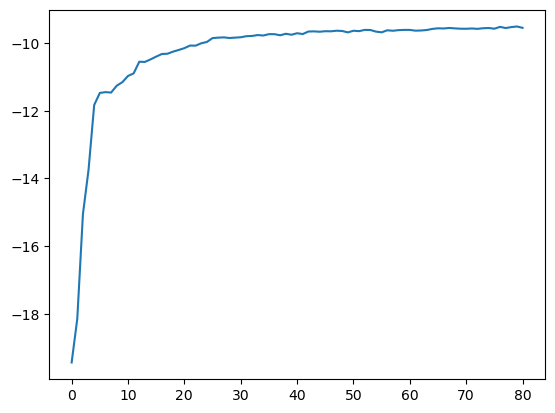

In [409]:
plt.plot(scores)
plt.show()

In [411]:
xgb_param_grid = {'n_estimators':(100,300), 'max_depth':(1,20),
                      'learning_rate':(0.01,1), 'gamma':(0.0 ,1.0), 'reg_alpha':(0.0,1.0), 'reg_lambda':(0.0,1.0),
                     'subsample':(0.01, 1.0), 'colsample_bytree':(0.01, 1.0)}
xgb_eval = generate_xgb_eval(X_train, y_train)
xgb_opt = BayesianOptimization(xgb_eval, xgb_param_grid, random_state=0)
xgb_opt.maximize(n_iter=20, init_points=10)

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -11.53    | 0.5533    | 0.7152    | 0.6067    | 11.35     | 184.7     | 0.6459    | 0.4376    | 0.8929    |
| 2         | -5.661e+0 | 0.964     | 0.3834    | 0.7938    | 11.05     | 213.6     | 0.9256    | 0.07104   | 0.09626   |
| 3         | -17.73    | 0.03002   | 0.8326    | 0.7804    | 17.53     | 295.7     | 0.7992    | 0.4615    | 0.7827    |
| 4         | -10.19    | 0.1271    | 0.6399    | 0.1519    | 18.95     | 204.4     | 0.4147    | 0.2646    | 0.7765    |
| 5         | -9.412    | 0.4616    | 0.5684    | 0.0286    | 12.74     | 222.4     | 0.6169    | 0.9437    | 0.685     |
| 6         | -17.72    | 0.3659    | 0.437     | 0.7007    | 2.144     | 233.4     | 0.6706    | 0.2104    | 0.1376    |
| 7         | -47.81    

In [414]:
params = xgb_opt.max['params']
params['n_estimators'] = int(params['n_estimators'])
params['max_depth'] = int(params['max_depth'])
xgb_reg = xgb.XGBRegressor(**params)
xgb_reg.fit(X_train, y_train)
y_pred = xgb_reg.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'rmse: {rmse:.2f}, r2: {r2:.2f}')

rmse: 9.32, r2: 0.93


In [799]:
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X, y, test_size=0.33, random_state=0)

In [800]:
X_test_k_new = kbest.transform(X_test_new)
y_pred_new = xgb_reg.predict(X_test_k_new)
rmse_new = mean_squared_error(y_test_new, y_pred_new, squared=False)
r2_new = r2_score(y_test_new, y_pred_new)
print(f'test rmse: {rmse_new:.2f}, r2: {r2_new:.2f}')

test rmse: 7.83, r2: 0.95


In [801]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test_new, y=y_pred_new, name='data',mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))
fig.add_trace(go.Scatter(x=y_test_new, y=y_test_new, name='perfect prediction',mode='lines', line=dict(dash='dash', color='red', width=3)))
fig.add_annotation(x=70, y=0, text=f'rmse = {rmse_new:.2f}', showarrow=False,  font={'size':17})
fig.update_layout(template = 'simple_white', title='Best prediction of XGBoost and test data',yaxis_title='y_pred',xaxis_title='y_test', showlegend=True)
fig.show()

In [814]:
data_new = data.drop_duplicates()

In [832]:
fig = px.histogram(data_new.number_of_elements)
fig.show()

In [817]:
element = data_new.loc[data_new.number_of_elements==1]

In [830]:
double = data_new.loc[data_new.number_of_elements==2]

In [837]:
triple = data_new.loc[data_new.number_of_elements==3]

In [840]:
four = data_new.loc[data_new.number_of_elements==4]

In [842]:
five = data_new.loc[data_new.number_of_elements==5]

In [839]:
data.critical_temp.median()

20.0

In [821]:
element.critical_temp.median()

4.0

In [834]:
double.critical_temp.median()

3.89

In [838]:
triple.critical_temp.median()

5.74

In [841]:
four.critical_temp.median()

24.3

In [843]:
five.critical_temp.median()

47.9

In [819]:
fig = px.histogram(element.critical_temp)
fig.show()

In [833]:
fig = px.histogram(double.critical_temp)
fig.show()

In [823]:
X_e = element.iloc[:,:-1]
y_e = element.iloc[:,-1]

In [849]:
X_d = double.iloc[:,:-1]
y_d = double.iloc[:,-1]

In [845]:
X_e_k = kbest.transform(X_e)
y_pred_e = xgb_reg.predict(X_e_k)
rmse_e = mean_squared_error(y_e, y_pred_e, squared=False)
r2_e = r2_score(y_e, y_pred_e)
print(f'test rmse: {rmse_e:.2f}, r2: {r2_e:.2f}')

test rmse: 5.07, r2: 0.35


In [850]:
X_d_k = kbest.transform(X_d)
y_pred_d = xgb_reg.predict(X_d_k)
rmse_d = mean_squared_error(y_d, y_pred_d, squared=False)
r2_d = r2_score(y_d, y_pred_d)
print(f'test rmse: {rmse_d:.2f}, r2: {r2_d:.2f}')

test rmse: 2.51, r2: 0.86


In [851]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_e, y=y_pred_e, name='data',mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))
fig.add_trace(go.Scatter(x=y_d, y=y_pred_d, name='data',mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))

fig.add_trace(go.Scatter(x=y_d, y=y_d, name='perfect prediction',mode='lines', line=dict(dash='dash', color='red', width=3)))
#fig.add_annotation(x=70, y=0, text=f'rmse = {rmse_e:.2f}', showarrow=False,  font={'size':17})
fig.update_layout(template = 'simple_white', title='Best prediction of XGBoost and test data',yaxis_title='y_pred',xaxis_title='y_test', showlegend=True)
fig.show()

In [828]:
y_pred_e = ols_k_cv.best_estimator_.predict(X_e)
rmse = mean_squared_error(y_e, y_pred_e, squared=False)
r2 = r2_score(y_e, y_pred_e)
print(f'test rmse: {rmse:.2f}, r2: {r2:.2f}')

test rmse: 8.23, r2: -0.71


In [829]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_e, y=y_pred_e, name='data',mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))
fig.add_trace(go.Scatter(x=y_e, y=y_e, name='perfect prediction',mode='lines', line=dict(dash='dash', color='red', width=3)))
#fig.add_annotation(x=70, y=0, text=f'rmse = {rmse_e:.2f}', showarrow=False,  font={'size':17})
fig.update_layout(template = 'simple_white', title='Best prediction of ols and test data',yaxis_title='y_pred',xaxis_title='y_test', showlegend=True)
fig.show()

In [852]:
X_k = kbest.transform(X)
y_pred = xgb_reg.predict(X_k)

In [855]:
fig = go.Figure()
fig.add_trace(go.Scatter(y=y_pred, x=X.range_ThermalConductivity, mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))
#fig.add_trace(go.Scatter(x=y_e, y=y_e, name='perfect prediction',mode='lines', line=dict(dash='dash', color='red', width=3)))
#fig.add_annotation(x=70, y=0, text=f'rmse = {rmse_e:.2f}', showarrow=False,  font={'size':17})
fig.update_layout(template = 'simple_white', title='',xaxis_title='y_pred',yaxis_title='range_ThermalConductivity', showlegend=True)
fig.show()

In [856]:
fig = go.Figure()
fig.add_trace(go.Scatter(y=y_pred, x=X.range_atomic_radius, mode='markers', marker=dict(size=10,line=dict(width=1, color='white'))))
#fig.add_trace(go.Scatter(x=y_e, y=y_e, name='perfect prediction',mode='lines', line=dict(dash='dash', color='red', width=3)))
#fig.add_annotation(x=70, y=0, text=f'rmse = {rmse_e:.2f}', showarrow=False,  font={'size':17})
fig.update_layout(template = 'simple_white', title='',xaxis_title='y_pred',yaxis_title='range_ThermalConductivity', showlegend=True)
fig.show()

In [ ]:
fractions = [.2, .25, .3, .35, .4, .45, .5, .6, .75, .8, 1.0]
train_size, train_scores, test_scores = learning_curve(pipe, X_train, y_train, train_sizes=fractions)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

In [ ]:
plt.subplots(figsize=(10, 5))
plt.errorbar(train_size, test_scores_mean, yerr=test_scores_std)
plt.xlabel('Training set size')
plt.ylabel('CV scores')
plt.title('Cross-validation score as training set size increases')
plt.show